In [6]:
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
#from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


#import scrublet as scr

from typing import Optional

import warnings
#warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

scanpy==1.8.1 anndata==0.7.8 umap==0.3.10 numpy==1.18.1 scipy==1.5.2 pandas==1.3.4 scikit-learn==1.0 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


In [2]:
xgb.__version__

'1.3.0'

# General Functions

In [3]:
def pre_process(adata):
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    return obs_quants

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

In [4]:
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    return obs_quants

# Mapping functions

In [12]:
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
    
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]

        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]

        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}'.format(ARI),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    )    
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

# Train on atlas

## Run 2 (DR common HVGs)

In [15]:
len(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(dr_corr[:,dr_corr.var.highly_variable].var_names))), len(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(rd1[:,rd1.var.highly_variable].var_names))),  len(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(Vsx2[:,Vsx2.var.highly_variable].var_names)))

(1066, 1002, 1158)

In [7]:
len(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(dr_corr[:,dr_corr.var.highly_variable].var_names))), len(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(rd1[:,rd1.var.highly_variable].var_names))),  len(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(Vsx2[:,Vsx2.var.highly_variable].var_names)))

(1066, 1002, 1158)

In [16]:
atlas_dict = {}
for num,i in enumerate(atlas.obs['Type_num'].values.categories):
    atlas_dict[i] = num

dr_atlas_hvgs = list(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(dr_corr[:,dr_corr.var.highly_variable].var_names)))

atlas.X = atlas.raw.X

In [19]:
valid_truelabel_atlas_dr, valid_predlabels_atlas_dr, model_atlas_dr = trainclassifier(train_anndata=atlas, 
                                                                                             common_top_genes=dr_atlas_hvgs, 
                                                                                             obs_id='Type_num', 
                                                                                             train_dict=atlas_dict, 
                                                                                             eta=0.2,
                                                                                             max_cells_per_ident=1000, train_frac=0.7, 
                                                                                             min_cells_per_ident=100)


trainclassifier() complete after 1542.0 seconds


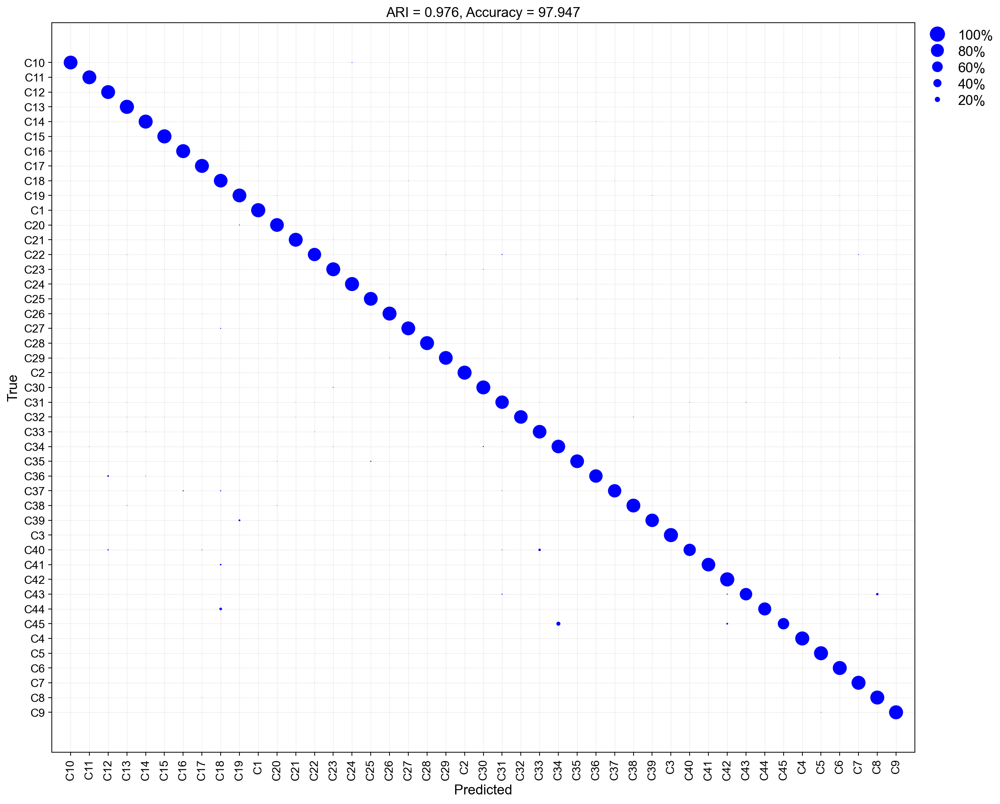

In [20]:
#last night
plot_validation_plots(valid_truelabel_atlas_dr, valid_predlabels_atlas_dr, train_dict=atlas_dict)

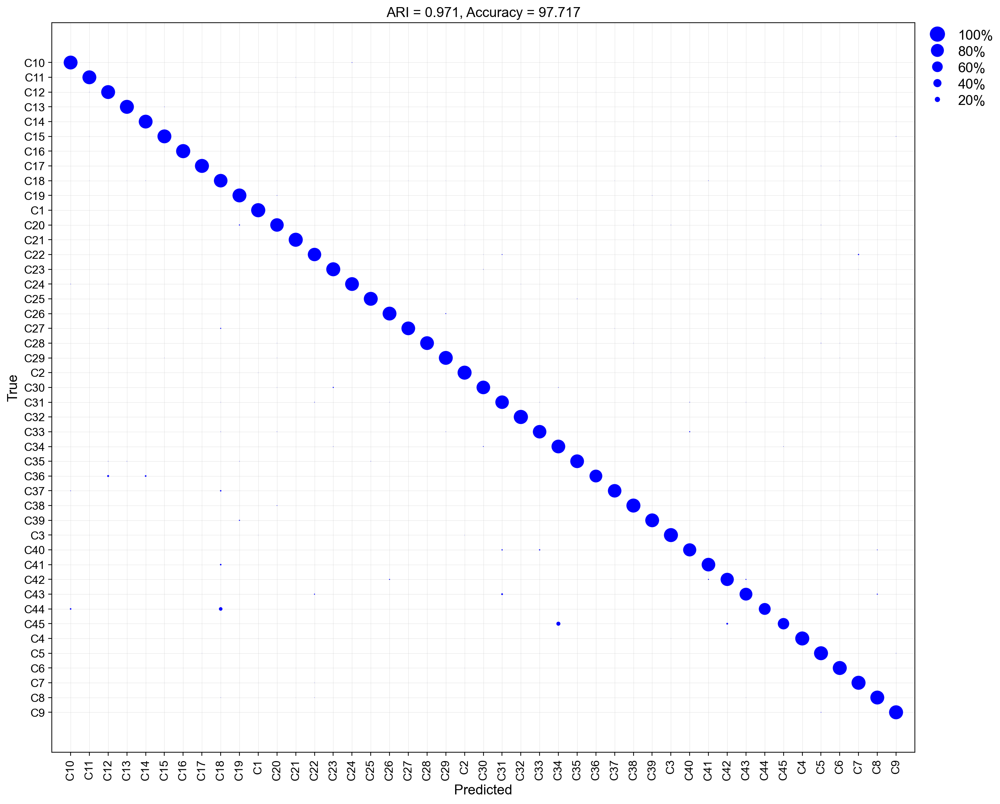

In [843]:
plot_validation_plots(valid_truelabel_atlas_dr, valid_predlabels_atlas_dr, train_dict=atlas_dict)

## Run 3 (rd1 common HVGs)

In [21]:
rd1_atlas_hvgs = list(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(rd1[:,rd1.var.highly_variable].var_names)))

In [22]:
valid_truelabel_atlas_rd1, valid_predlabels_atlas_rd1, model_atlas_rd1 = trainclassifier(train_anndata=atlas, 
                                                                                             common_top_genes=rd1_atlas_hvgs, 
                                                                                             obs_id='Type_num', 
                                                                                             train_dict=atlas_dict, 
                                                                                             eta=0.2,
                                                                                             max_cells_per_ident=1000, train_frac=0.7, 
                                                                                             min_cells_per_ident=100)


trainclassifier() complete after 1315.0 seconds


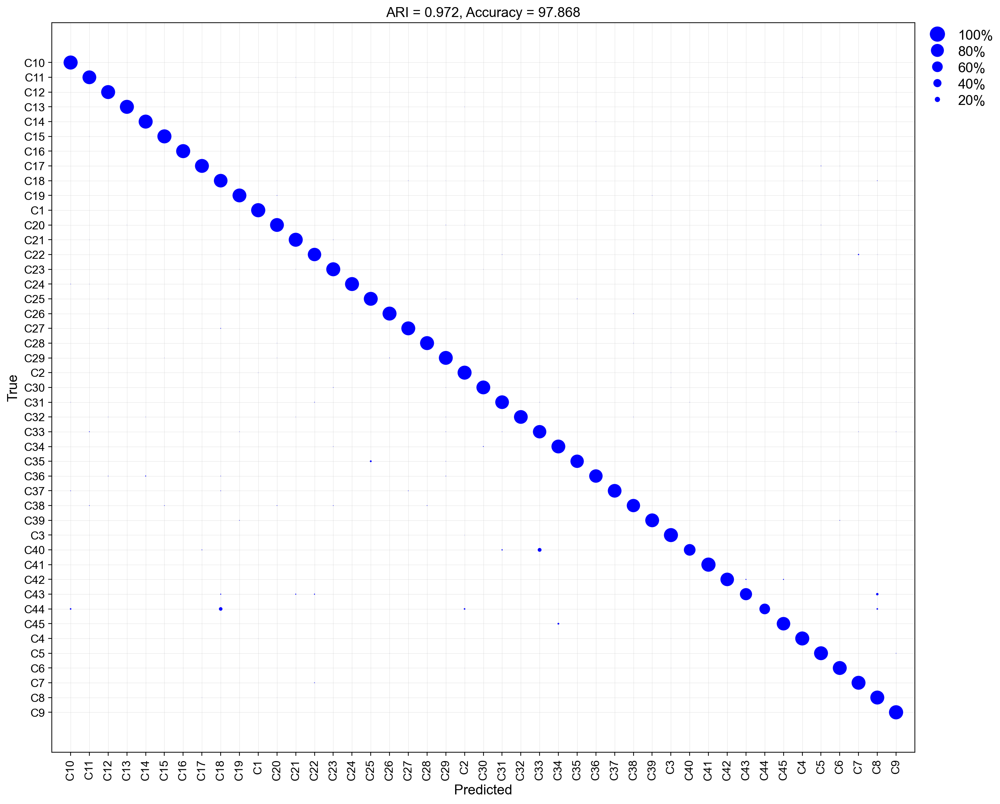

In [23]:
#last night
plot_validation_plots(valid_truelabel_atlas_rd1, valid_predlabels_atlas_rd1, train_dict=atlas_dict)

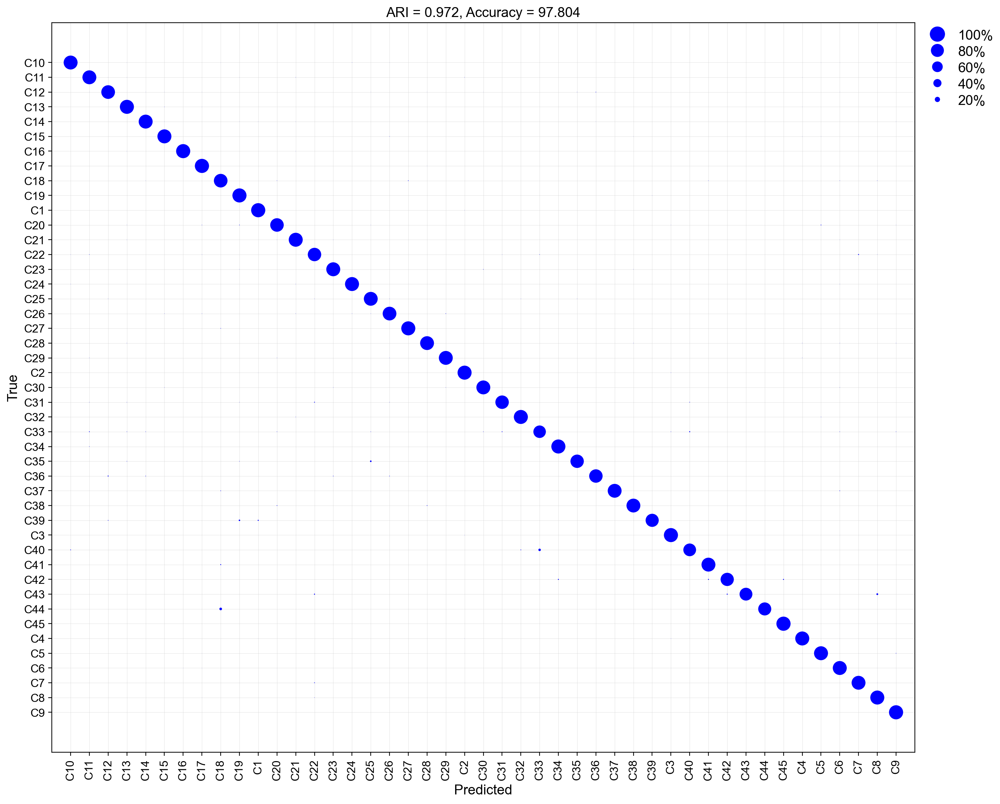

In [846]:
plot_validation_plots(valid_truelabel_atlas_rd1, valid_predlabels_atlas_rd1, train_dict=atlas_dict)

## Run 4 (Vsx2 common HVGs)

In [24]:
vsx2_atlas_hvgs = list(set(atlas[:,atlas.var.highly_variable].var_names).intersection(set(Vsx2[:,Vsx2.var.highly_variable].var_names)))

In [25]:
valid_truelabel_atlas_vsx2, valid_predlabels_atlas_vsx2, model_atlas_vsx2 = trainclassifier(train_anndata=atlas, 
                                                                                             common_top_genes=vsx2_atlas_hvgs, 
                                                                                             obs_id='Type_num', 
                                                                                             train_dict=atlas_dict, 
                                                                                             eta=0.2,
                                                                                             max_cells_per_ident=1000, train_frac=0.7, 
                                                                                             min_cells_per_ident=100)


trainclassifier() complete after 1441.0 seconds


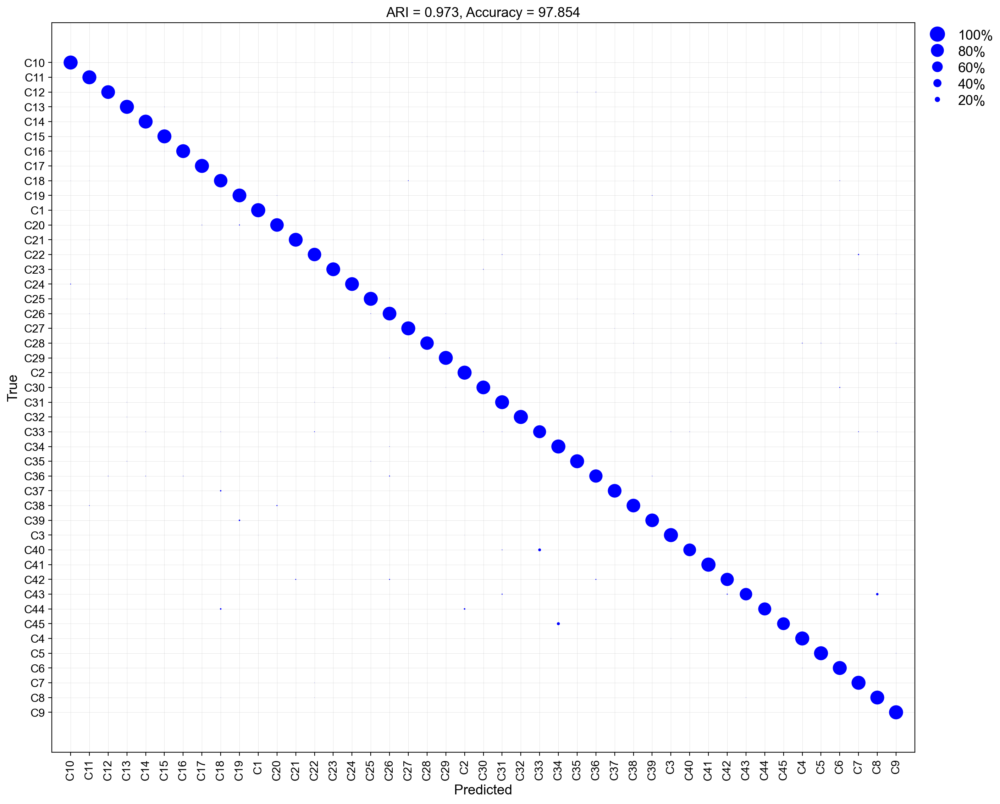

In [26]:
#last night
plot_validation_plots(valid_truelabel_atlas_vsx2, valid_predlabels_atlas_vsx2, train_dict=atlas_dict)

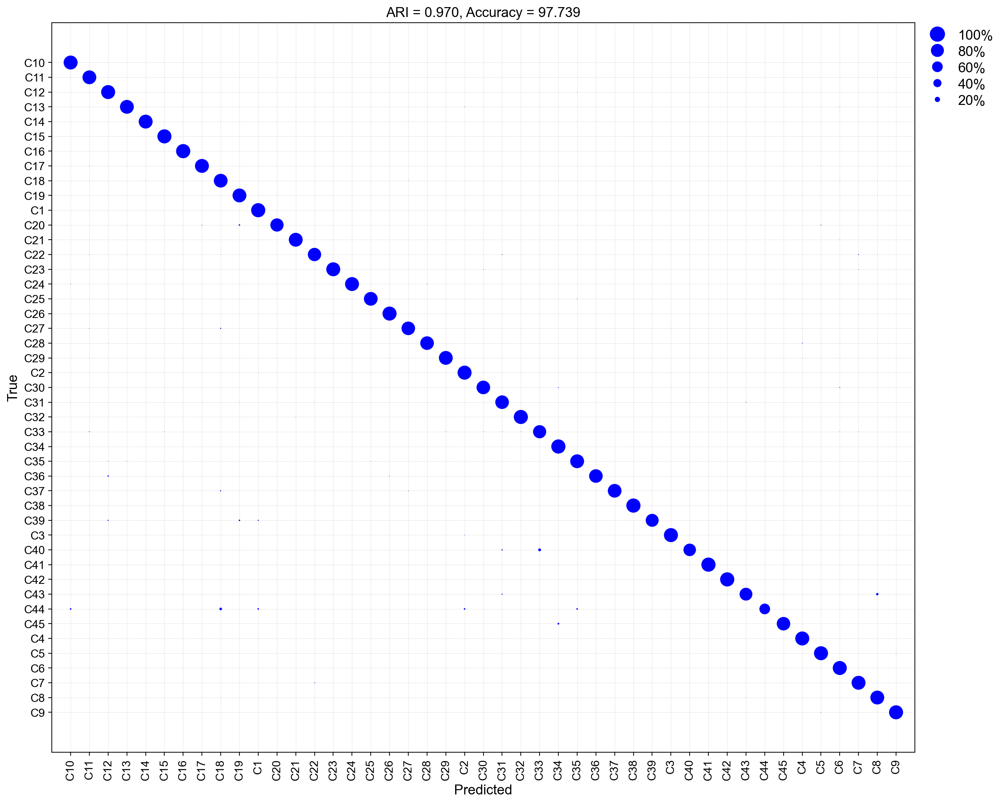

In [849]:
plot_validation_plots(valid_truelabel_atlas_vsx2, valid_predlabels_atlas_vsx2, train_dict=atlas_dict)

# Save VD objects and atlas

In [1186]:
dr_corr.write_h5ad('DR_processed.h5ad')
rd1.write_h5ad('rd1_processed.h5ad')
Vsx2.write_h5ad('Vsx2_processed.h5ad')

In [1198]:
atlas.write_h5ad('atlas_processed.h5ad')

In [11]:
dr_corr = sc.read_h5ad('DR_processed.h5ad')
rd1 = sc.read_h5ad('rd1_processed.h5ad')
Vsx2 = sc.read_h5ad('Vsx2_processed.h5ad')

In [12]:
atlas = sc.read_h5ad('atlas_processed.h5ad')

# Check ribosomal proteins

In [54]:
atlas_copy = atlas.copy()

In [71]:
atlas.var['Rp'] = atlas.var_names.str.startswith('Rp')
dr_corr.var['Rp'] = dr_corr.var_names.str.startswith('Rp')
rd1.var['Rp'] = rd1.var_names.str.startswith('Rp')
Vsx2.var['Rp'] = Vsx2.var_names.str.startswith('Rp')

In [72]:
sc.pp.calculate_qc_metrics(atlas, qc_vars=['Rp'], inplace=True)
sc.pp.calculate_qc_metrics(dr_corr, qc_vars=['Rp'], inplace=True)
sc.pp.calculate_qc_metrics(rd1, qc_vars=['Rp'], inplace=True)
sc.pp.calculate_qc_metrics(Vsx2, qc_vars=['Rp'], inplace=True)

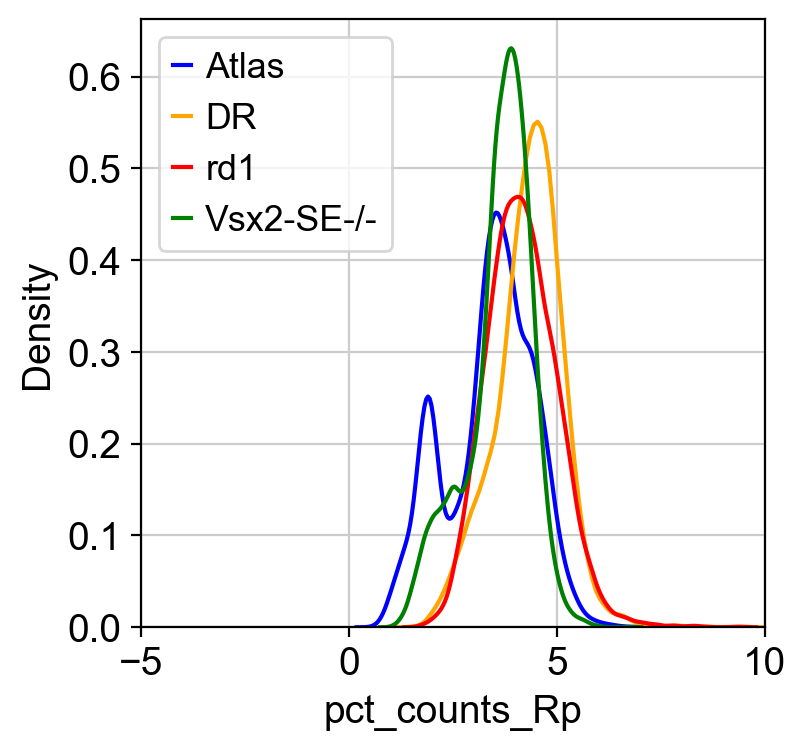

In [144]:
sn.kdeplot(atlas.obs['pct_counts_Rp'], label='Atlas',color='blue', cumulative=False)
sn.kdeplot(dr_corr.obs['pct_counts_Rp'], label='DR', color='orange', cumulative=False)
sn.kdeplot(rd1.obs['pct_counts_Rp'], label='rd1',color='red', cumulative=False)
sn.kdeplot(Vsx2.obs['pct_counts_Rp'], label='Vsx2-SE-/-', color='green', cumulative=False)
plt.legend()
plt.xlabel('pct_counts_Rp')
plt.xlim([-5,10])
plt.show()

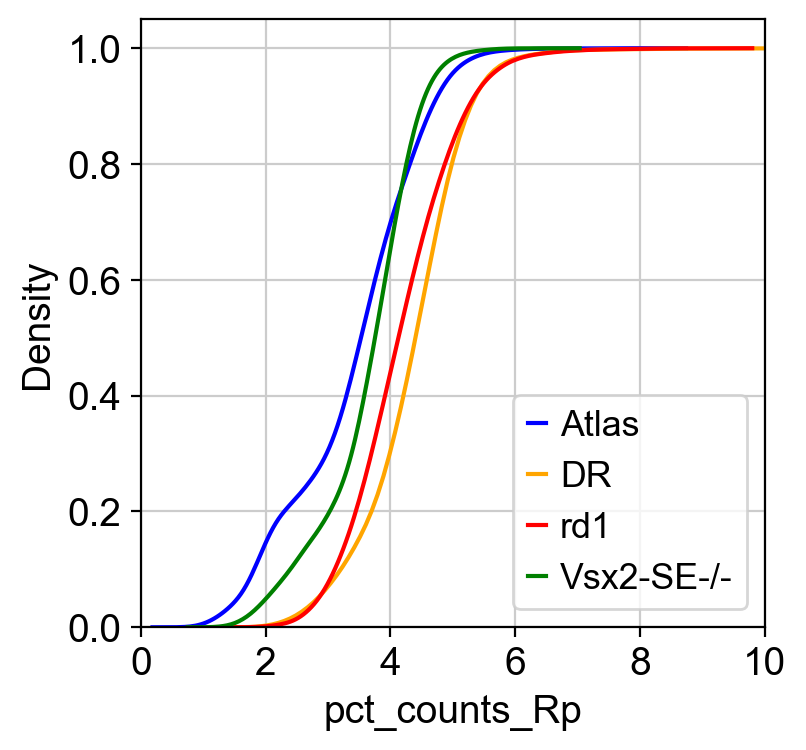

In [81]:
sn.kdeplot(atlas.obs['pct_counts_Rp'], label='Atlas',color='blue', cumulative=True)
sn.kdeplot(dr_corr.obs['pct_counts_Rp'], label='DR', color='orange', cumulative=True)
sn.kdeplot(rd1.obs['pct_counts_Rp'], label='rd1',color='red', cumulative=True)
sn.kdeplot(Vsx2.obs['pct_counts_Rp'], label='Vsx2-SE-/-', color='green', cumulative=True)
plt.legend()
plt.xlabel('pct_counts_Rp')
plt.xlim([0,10])
plt.show()

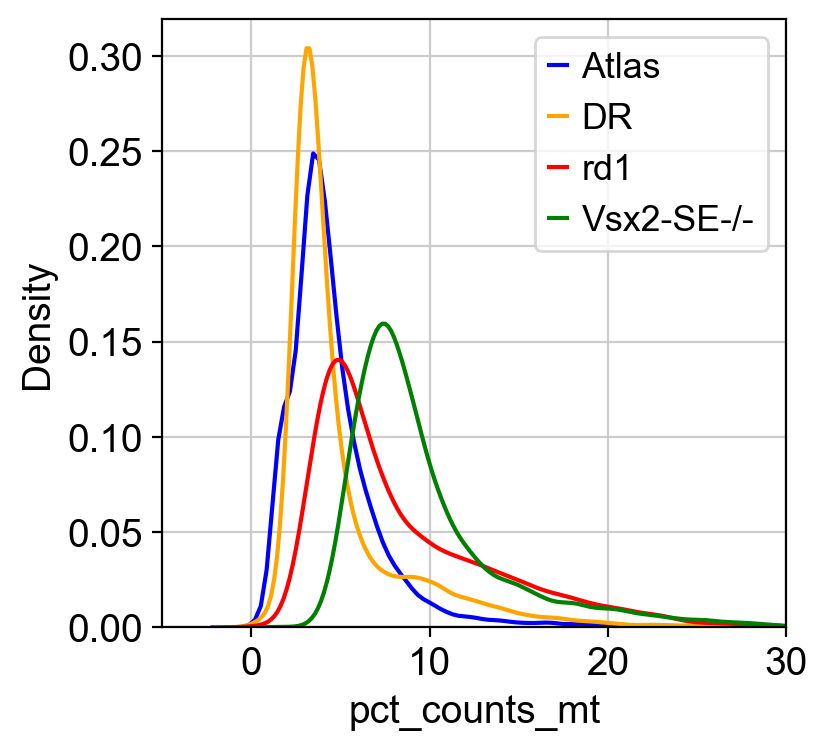

In [152]:
sn.kdeplot(atlas.obs['pct_counts_mt'], label='Atlas',color='blue', cumulative=False)
sn.kdeplot(dr_corr.obs['pct_counts_mt'], label='DR', color='orange', cumulative=False)
sn.kdeplot(rd1.obs['pct_counts_mt'], label='rd1',color='red', cumulative=False)
sn.kdeplot(Vsx2.obs['pct_counts_mt'], label='Vsx2-SE-/-', color='green', cumulative=False)
plt.legend()
plt.xlabel('pct_counts_mt')
plt.xlim([-5,30])
plt.show()

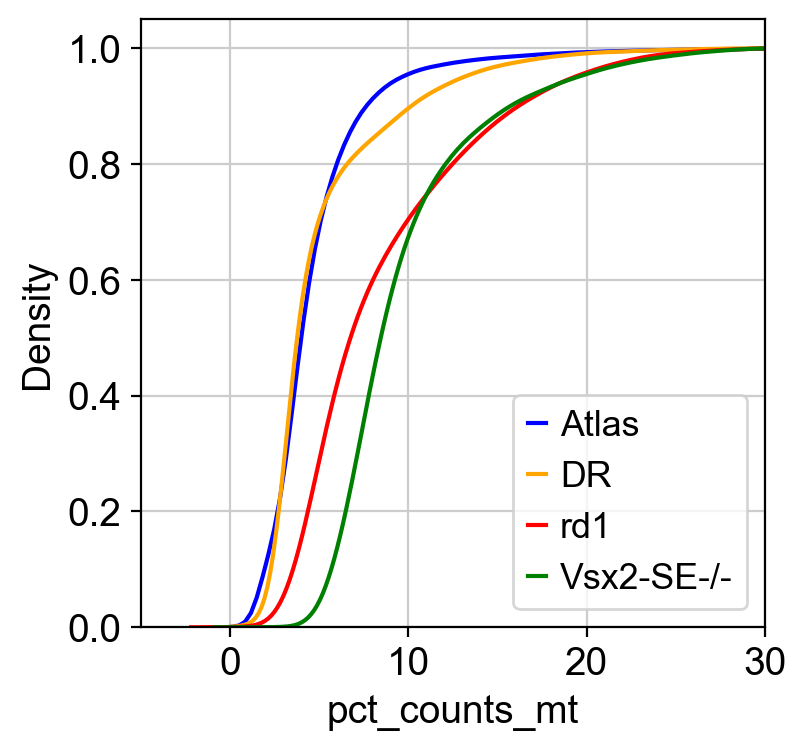

In [70]:
sn.kdeplot(atlas.obs['pct_counts_mt'], label='Atlas',color='blue', cumulative=True)
sn.kdeplot(dr_corr.obs['pct_counts_mt'], label='DR', color='orange', cumulative=True)
sn.kdeplot(rd1.obs['pct_counts_mt'], label='rd1',color='red', cumulative=True)
sn.kdeplot(Vsx2.obs['pct_counts_mt'], label='Vsx2-SE-/-', color='green', cumulative=True)
plt.legend()
plt.xlabel('pct_counts_mt')
plt.xlim([-5,30])
plt.show()

In [140]:
comb_processed = atlas.concatenate(dr_corr, rd1, Vsx2, batch_categories=['NR', 'DR', 'rd1', 'Vsx2-SE-/-'])

In [141]:
comb_processed.write_h5ad('comb_all4_processed.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Batch' as categorical
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden' as categorical
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a fut

In [158]:
comb_processed = sc.read_h5ad('comb_all4_processed.h5ad')

In [160]:
comb_processed = comb_processed[comb_processed.obs['pct_counts_Rp']<10,:]

comb_processed = comb_processed[comb_processed.obs['pct_counts_mt']<30,:]

In [170]:
sc.set_figure_params(dpi=100, dpi_save=100)


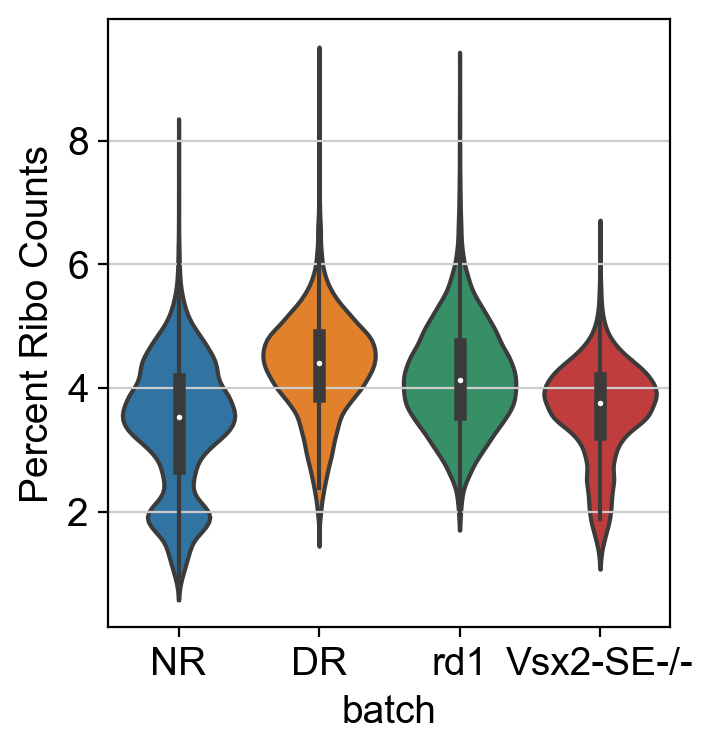

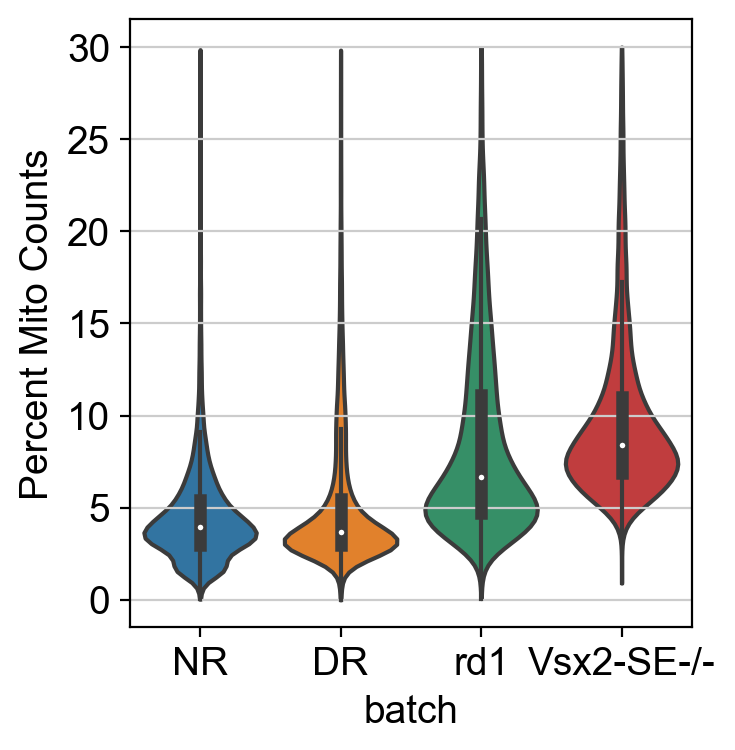

In [174]:
sc.pl.violin(comb_processed, keys='pct_counts_Rp', groupby='batch',  
             stripplot=False, inner='box', xlabel='',
             ylabel='Percent Ribo Counts', save='_perc_ribo.pdf')
sc.pl.violin(comb_processed, keys='pct_counts_mt', groupby='batch',  
             stripplot=False,  inner='box', xlabel='',
             ylabel='Percent Mito Counts', save='_perc_mito.pdf')

# Map to atlas

* do mapping and record each cell's mapping in the .obs df
* make validation and mapping cfm plot
* make umap colored by mapping C1-C45 cluster
* prob of each mapping
* freq of cluster in VD vs NR

## DR

In [851]:
test_labels_dr, test_predlabels_dr, test_prediction_dr = predict(train_anndata=atlas, 
                                                                 common_top_genes=dr_atlas_hvgs, 
                                                                 bst_model_train_full=model_atlas_dr, 
                                                                 test_anndata=dr_corr,
                                                                 train_obs_id='Type_num', 
                                                                 test_dict=dr_dict, 
                                                                 test_obs_id='leiden')

In [217]:
dr_dict.keys()

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32'])

In [865]:
dr_cols  = ['C1', 'C2', 'C5', 'C9',
            'C3', 'C40', 'C33','C6', 
       'C19',
            'C4',  'C28','C10', 'C7', 'C8',
            'C26', 'C29','C24', 'C16',
            'C18',  'C37', 'C41','C11', 'C14',  'C36',   'C34',
            'C23', 'C30','C13', 
            'C25', 'C35', 'C12',
             'C15', 'C31','C17', 
              'C20',
        'C27', 'C21', 'C22',
           'C38', 'C32', 'C44', 
       'C45',  'C39', 
        'C43',  'C42',]

dr_rows = ['10','4', '32', '0', '1', '2', '3', '5', '6', '7', '8',  '25','9', '11', '12', '13', '14', '15', '16', 
           '17', '18', '19', '20', '21', '22', '23', '24', '26', '27', '28', '29', '30', '31']

figures/dr_atlas_mapping.pdf


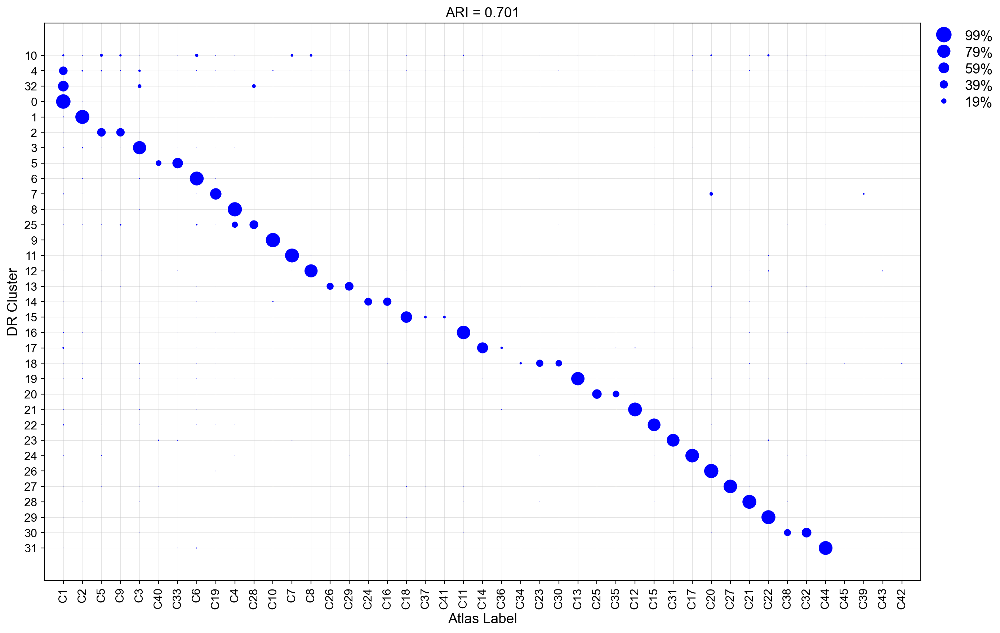

In [867]:
plot_mapping(test_labels=test_labels_dr, 
             test_predlabels=test_predlabels_dr, 
             test_dict=dr_dict, 
             train_dict=atlas_dict,
             re_order=True, re_order_cols=dr_cols,
             re_index=True, re_order_rows=dr_rows,
                 xaxislabel='Atlas Label', yaxislabel='DR Cluster',)
#            save_as='figures/dr_atlas_mapping.pdf')

Merge 4, 32, 0, remove 10

In [890]:
dr_corr = dr_corr[dr_corr.obs.leiden!='10',:]

dr_corr_leiden_new = []

for i in (dr_corr.obs.leiden):
    if (i in ('4','32', '0')):
        dr_corr_leiden_new.append('4_32_0')
        
    else:
        dr_corr_leiden_new.append(i)

In [920]:
dr_corr_leiden_new_cat = pd.Categorical(dr_corr_leiden_new)
dr_corr_leiden_new_cat.value_counts().sort_values(ascending=False)

a = dr_corr_leiden_new_cat.reorder_categories(list(dr_corr_leiden_new_cat.value_counts().sort_values(ascending=False).index))

b = a.rename_categories(np.arange(len(a.categories)))
b.value_counts().sort_values(ascending=False)

dr_corr.obs['leiden_new'] = b

dr_corr.obs['leiden_new'] = pd.Categorical(dr_corr.obs['leiden_new'].values.astype('str'))

dr_dict = make_dict(dr_corr, obs_id='leiden_new')

In [27]:
dr_dict = make_dict(dr_corr, obs_id='leiden_new')

In [28]:
test_labels_dr, test_predlabels_dr, test_prediction_dr = predict(train_anndata=atlas, 
                                                                 common_top_genes=dr_atlas_hvgs, 
                                                                 bst_model_train_full=model_atlas_dr, 
                                                                 test_anndata=dr_corr,
                                                                 train_obs_id='Type_num', 
                                                                 test_dict=dr_dict, 
                                                                 test_obs_id='leiden_new')

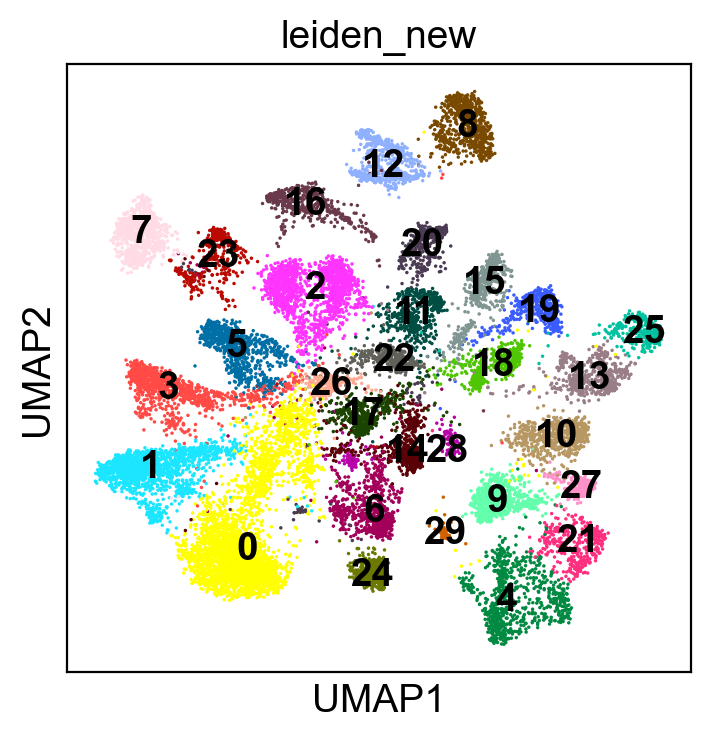

In [895]:
sc.pl.umap(dr_corr, color='leiden_new', legend_loc='on data')

In [31]:
dr_cols  = [ 'C8','C40', 'C33','C1', 'C2', 'C5', 'C9',
            'C3', 'C6', 
       'C19',
            'C4',  'C28','C10',  'C27','C7',
            'C26', 'C29','C24', 'C16',
            'C18',  'C37', 'C41','C11', 'C14',  'C36',   'C34',
            'C23', 'C30','C13', 
            'C25', 'C35', 'C12',
             'C15', 'C31','C17', 
              'C20',
        'C21', 'C22',
           'C38', 'C32', 'C44', 
       'C45',  'C39', 
        'C43',  'C42',]

dr_rows = ['10','4',  '0', '1', '2', '3', '5', '6', '7','23', '8',  '25','9', '11', '12', '13', '14', '15', '16', 
           '17', '18', '19', '20', '21', '22',  '24', '26', '27', '28', '29',]

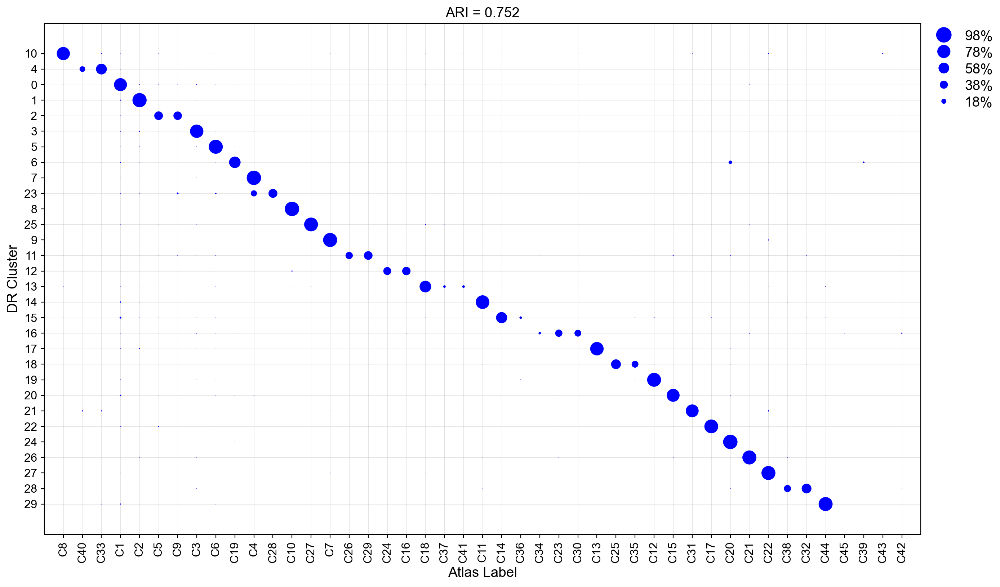

In [32]:
plot_mapping(test_labels=test_labels_dr, 
             test_predlabels=test_predlabels_dr, 
             test_dict=dr_dict, 
             train_dict=atlas_dict,
              re_order=True, re_order_cols=dr_cols,
              re_index=True, re_order_rows=dr_rows,
                 xaxislabel='Atlas Label', yaxislabel='DR Cluster',)
            #save_as='figures/dr_atlas_mapping.pdf')

In [937]:
def encode_dict(orig_dict, labels):
    dict_series = pd.Series(orig_dict)
    encoded_labels = []
    for i in labels:
        encoded_labels.append(dict_series.index[i])
    return encoded_labels

dr_corr.obs['Prob'] = np.max(test_prediction_dr, axis=1)

dr_corr.obs['Atlas Label'] =  encode_dict(atlas_dict, test_predlabels_dr)

... storing 'Atlas Label' as categorical


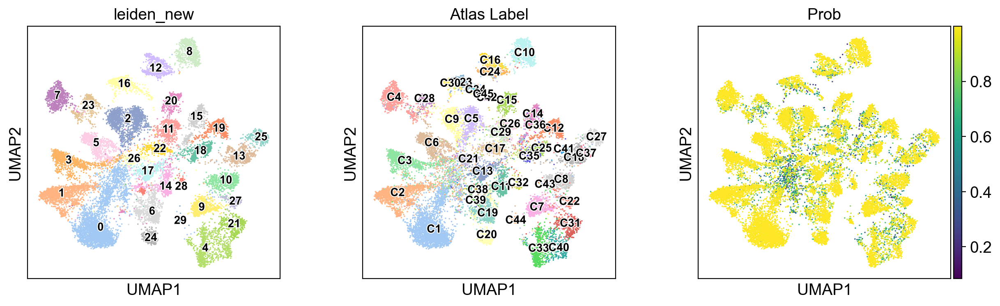

In [938]:
sc.pl.umap(dr_corr, color=['leiden_new', 'Atlas Label', 'Prob'], legend_loc='on data', palette=type_cols, 
           legend_fontoutline=1.5, legend_fontsize=10, 
          add_outline=False)

In [60]:
np.mean(dr_corr.obs['Prob'].values), np.mean(rd1.obs['Prob'].values), np.mean(Vsx2.obs['Prob'].values)

(0.92849505, 0.94051665, 0.94846916)

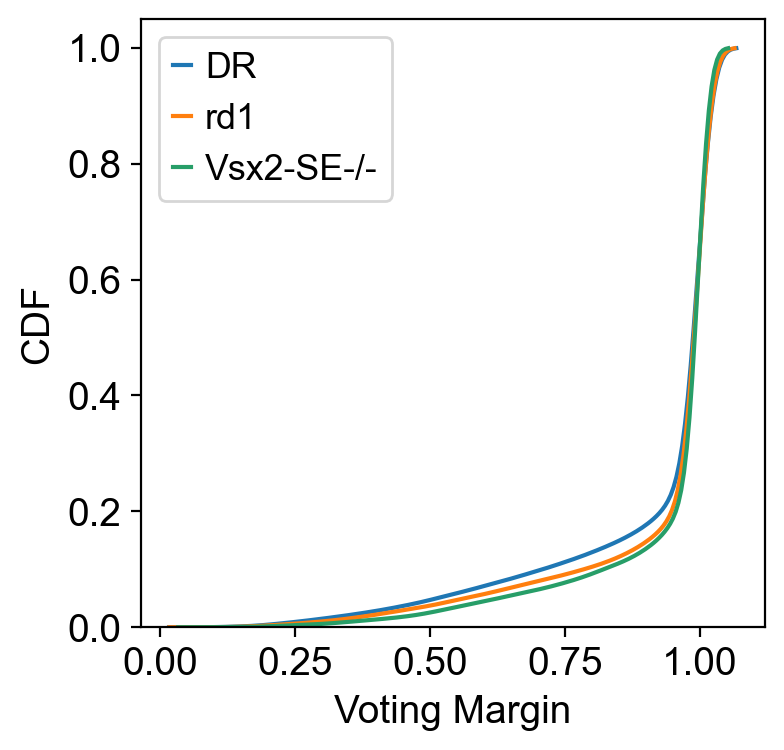

In [54]:
sn.kdeplot(dr_corr.obs['Prob'].values, cumulative=True, label='DR')
sn.kdeplot(rd1.obs['Prob'].values, cumulative=True, label='rd1')
sn.kdeplot(Vsx2.obs['Prob'].values,cumulative=True,  label='Vsx2-SE-/-')
plt.xlabel('Voting Margin')
plt.ylabel('CDF')

#plt.title('VD RGCs')
plt.legend()
plt.grid(False)
plt.savefig('figures/MappingProbs_CDF.pdf')

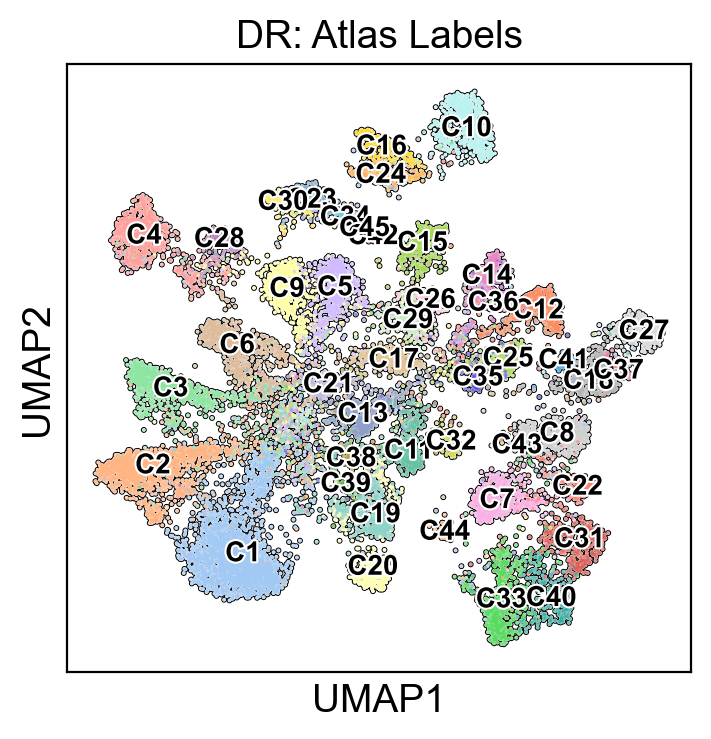

In [939]:
sc.pl.umap(dr_corr, color=['Atlas Label'], title='DR: Atlas Labels',
           legend_fontoutline=1.5, legend_fontsize=10, legend_loc='on data', palette=type_cols,
          add_outline=True, save='_DR_type.pdf')

In [951]:
type_cols = sn.color_palette('pastel').as_hex()+sn.color_palette('Set3').as_hex()+sn.color_palette('Set2').as_hex()+sn.color_palette('hls').as_hex()+sn.color_palette('husl').as_hex()
dr_corr.uns['leiden_new_colors']= type_cols

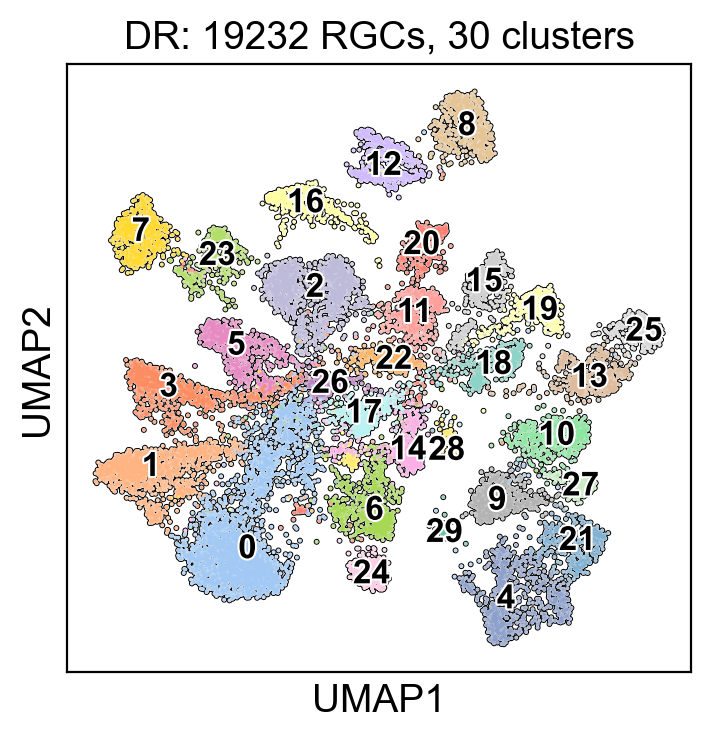

In [952]:
sc.pl.umap(dr_corr, color=['leiden_new'], title='DR: '+ str(dr_corr.shape[0])+ ' RGCs, ' + str(len(dr_corr.obs.leiden_new.values.categories)) + ' clusters',
           legend_fontoutline=1.5, legend_fontsize=12, legend_loc='on data',
          add_outline=True, save='_DR_leiden.pdf')

## rd1

In [175]:
test_labels_rd1, test_predlabels_rd1, test_prediction_rd1 = predict(train_anndata=atlas, 
                                                                 common_top_genes=rd1_atlas_hvgs, 
                                                                 bst_model_train_full=model_atlas_rd1, 
                                                                 test_anndata=rd1,
                                                                 train_obs_id='Type_num', 
                                                                 test_dict=rd1_dict, 
                                                                 test_obs_id='leiden_new')

In [263]:
re_cats = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8',
       'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16',
       'C17', 'C18', 'C19', 'C20', 'C21', 'C22',
       'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29',
        'C30', 'C31', 'C32', 'C33', 'C34',
       'C35', 'C36', 'C37', 'C38', 'C39', 'C40',
       'C41', 'C42', 'C43', 'C44',
       'C45', ]

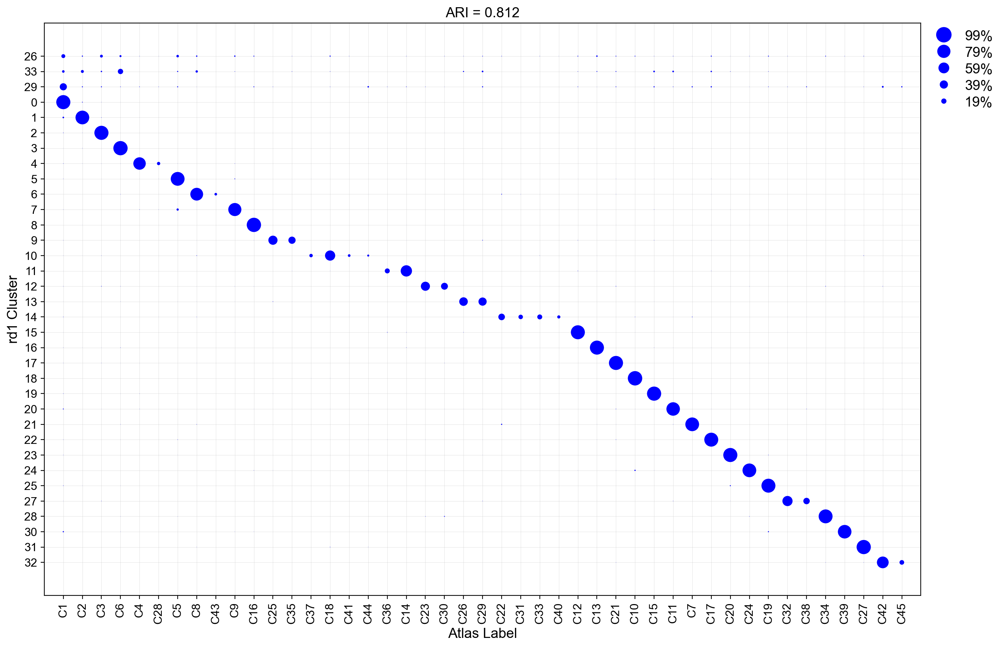

In [538]:
rd1_cols = ['C1', 'C2', 'C3',  'C6', 'C4', 'C28',
            'C5',  'C8', 'C43', 'C9', 'C16', 
            'C25', 'C35','C37', 'C18',  
       'C41',  'C44',  'C36',
            'C14', 'C23', 'C30', 
            'C26', 'C29', 'C22','C31', 'C33', 
          'C40',
            'C12','C13',  
             'C21',  'C10',
             'C15', 'C11', 
            'C7',  'C17',
       'C20', 'C24',   'C19','C32',  'C38','C34',
          'C39',   'C27', 'C42',
          'C45', ]

rd1_rows = ['26', '33', '29', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '27', '28', '30', '31', '32']

rd1_rows = np.array(rd1_rows).astype(int)

plot_mapping(test_labels=test_labels_rd1, 
             test_predlabels=test_predlabels_rd1, 
             test_dict=rd1_dict, 
             train_dict=atlas_dict,  
             re_order=True, re_order_cols=rd1_cols, 
              re_index=True, re_order_rows=rd1_rows, 
                 xaxislabel='Atlas Label', yaxislabel='rd1 Cluster', 
            save_as='figures/rd1_atlas_mapping.pdf')

Merge 0, 29. remove 26, 33

In [979]:
rd1 = rd1[rd1.obs.leiden_new!='26',:]
rd1 = rd1[rd1.obs.leiden_new!='33',:]

rd1_leiden_new = []

for i in (rd1.obs.leiden_new):
    if (i in ('29', '0')):
        rd1_leiden_new.append('29_0')
        
    else:
        rd1_leiden_new.append(i)

rd1_leiden_new_cat = pd.Categorical(rd1_leiden_new)
rd1_leiden_new_cat.value_counts().sort_values(ascending=False)

a = rd1_leiden_new_cat.reorder_categories(list(rd1_leiden_new_cat.value_counts().sort_values(ascending=False).index))

b = a.rename_categories(np.arange(len(a.categories)))
b.value_counts().sort_values(ascending=False)

rd1.obs['leiden_new'] = b

rd1.obs['leiden_new'] = pd.Categorical(rd1.obs['leiden_new'].values.astype('str'))

rd1_dict = make_dict(rd1, obs_id='leiden_new')

In [980]:
test_labels_rd1, test_predlabels_rd1, test_prediction_rd1 = predict(train_anndata=atlas, 
                                                                 common_top_genes=rd1_atlas_hvgs, 
                                                                 bst_model_train_full=model_atlas_rd1, 
                                                                 test_anndata=rd1,
                                                                 train_obs_id='Type_num', 
                                                                 test_dict=rd1_dict, 
                                                                 test_obs_id='leiden_new')

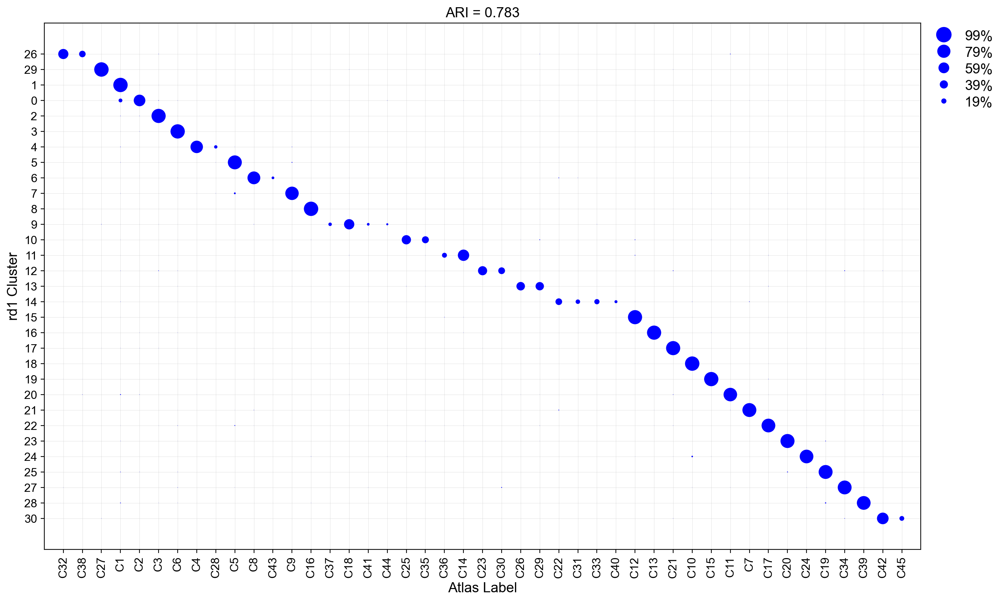

In [988]:
rd1_cols = ['C32',  'C38','C27','C1', 'C2', 'C3',  'C6', 'C4', 'C28',
            'C5',  'C8', 'C43', 'C9', 'C16', 
            'C37', 'C18', 'C41',  'C44','C25', 'C35', 
         'C36',
            'C14', 'C23', 'C30', 
            'C26', 'C29', 'C22','C31', 'C33', 
          'C40',
            'C12','C13',  
             'C21',  'C10',
             'C15', 'C11', 
            'C7',  'C17',
       'C20', 'C24',   'C19','C34',
          'C39',    'C42',
          'C45', ]

rd1_rows = ['26', '29',  '1', '0', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '27', '28', '30',]

#rd1_rows = np.array(rd1_rows).astype(int)

plot_mapping(test_labels=test_labels_rd1, 
             test_predlabels=test_predlabels_rd1, 
             test_dict=rd1_dict, 
             train_dict=atlas_dict,  
               re_order=True, re_order_cols=rd1_cols, 
                re_index=True, re_order_rows=rd1_rows, 
                 xaxislabel='Atlas Label', yaxislabel='rd1 Cluster', 
            save_as='figures/rd1_atlas_mapping.pdf')

In [989]:
rd1.obs['Prob'] = np.max(test_prediction_rd1, axis=1)
rd1.obs['Atlas Label'] = encode_dict(atlas_dict, test_predlabels_rd1)

... storing 'Atlas Label' as categorical


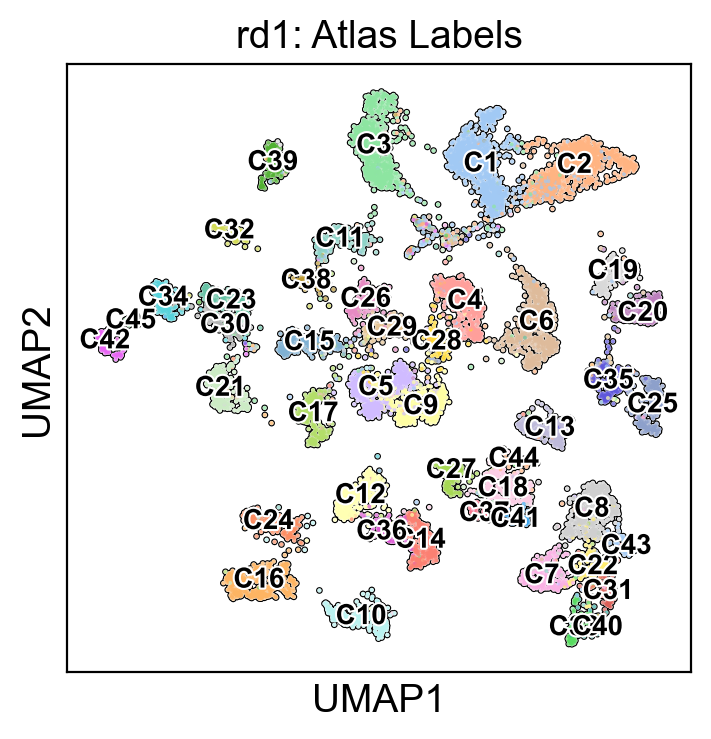

In [990]:
sc.pl.umap(rd1, color=['Atlas Label'], title='rd1: Atlas Labels',
           legend_fontoutline=1.5, legend_fontsize=10, legend_loc='on data', palette=type_cols,
          add_outline=True, save='_rd1_type.pdf')

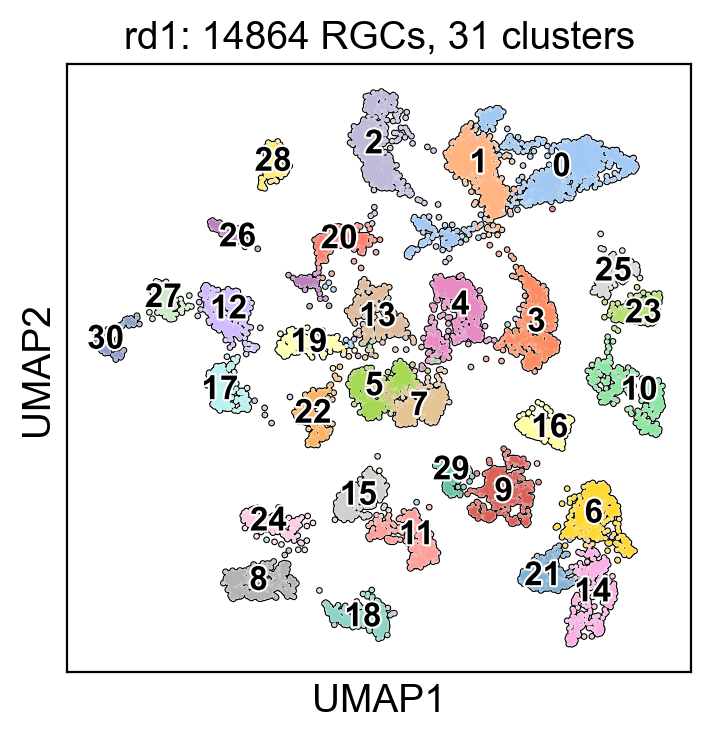

In [991]:
sc.pl.umap(rd1, color=['leiden_new'], title='rd1: '+ str(rd1.shape[0])+ ' RGCs, ' + str(len(rd1.obs.leiden_new.values.categories)) + ' clusters',
           legend_fontoutline=1.5, legend_fontsize=12, legend_loc='on data',palette=type_cols,
          add_outline=True,  save='_rd1_leiden.pdf')


Text(0, 0.5, 'Avg Pred Prob')

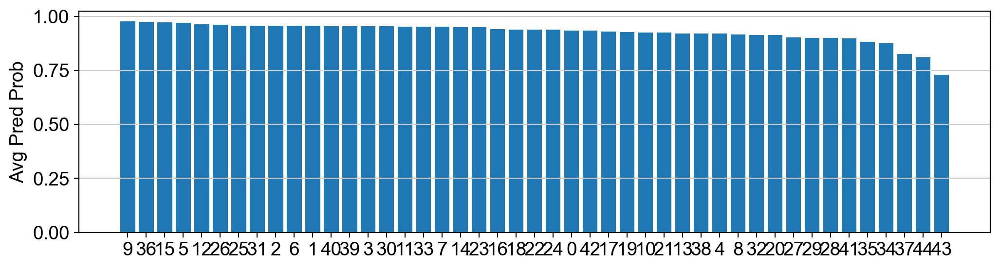

In [976]:
plt.figure(figsize=(12,3))
plt.bar(np.array(pd.Series(clust_obs(rd1, 'Prob', obs_id_split=None)).sort_values(ascending=False).index).astype('str'), 
       pd.Series(clust_obs(rd1, 'Prob', obs_id_split=None)).sort_values(ascending=False).values)
plt.grid(axis='x')
plt.ylabel('Avg Pred Prob')

In [288]:
rd1_atlas_freqs = rd1.obs['Atlas Label'].value_counts(normalize=True)
atlas_freqs = atlas.obs.Type_num.value_counts(normalize=True)
rd1_atlas_freqs = rd1_atlas_freqs.reindex(atlas_freqs.index)
rd1_freq_ratio = rd1_atlas_freqs/atlas_freqs

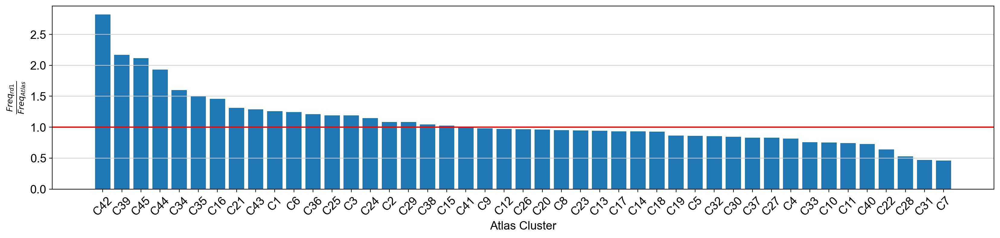

In [28]:
rd1_atlas_freqs = rd1.obs['Atlas Label'].value_counts(normalize=True)

atlas_freqs = atlas.obs.Type_num.value_counts(normalize=True)

rd1_atlas_freqs = rd1_atlas_freqs.reindex(atlas_freqs.index)

rd1_freq_ratio = rd1_atlas_freqs/atlas_freqs

plt.figure(figsize=(20,4))
plt.bar(rd1_freq_ratio.sort_values(ascending=False).index.values, 
        rd1_freq_ratio.sort_values(ascending=False).values)
plt.xticks(rotation=45)
plt.xlabel('Atlas Cluster')
plt.ylabel(r'$\frac{Freq_{rd1}}{Freq_{Atlas}}$')
plt.grid(axis='x')
plt.axhline(1,  color='r')
plt.show()

## Vsx2-SE-/-

In [187]:
test_labels_Vsx2, test_predlabels_Vsx2, test_prediction_Vsx2 = predict(train_anndata=atlas, 
                                                                 common_top_genes=vsx2_atlas_hvgs, 
                                                                 bst_model_train_full=model_atlas_vsx2, 
                                                                 test_anndata=Vsx2,
                                                                 train_obs_id='Type_num', 
                                                                 test_dict=Vsx2_dict, 
                                                                 test_obs_id='leiden_new')

In [297]:
np.array(list(Vsx2_dict.keys())).astype('str')

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34',
       '35', '36', '37', '38', '39', '40', '41'], dtype='<U21')

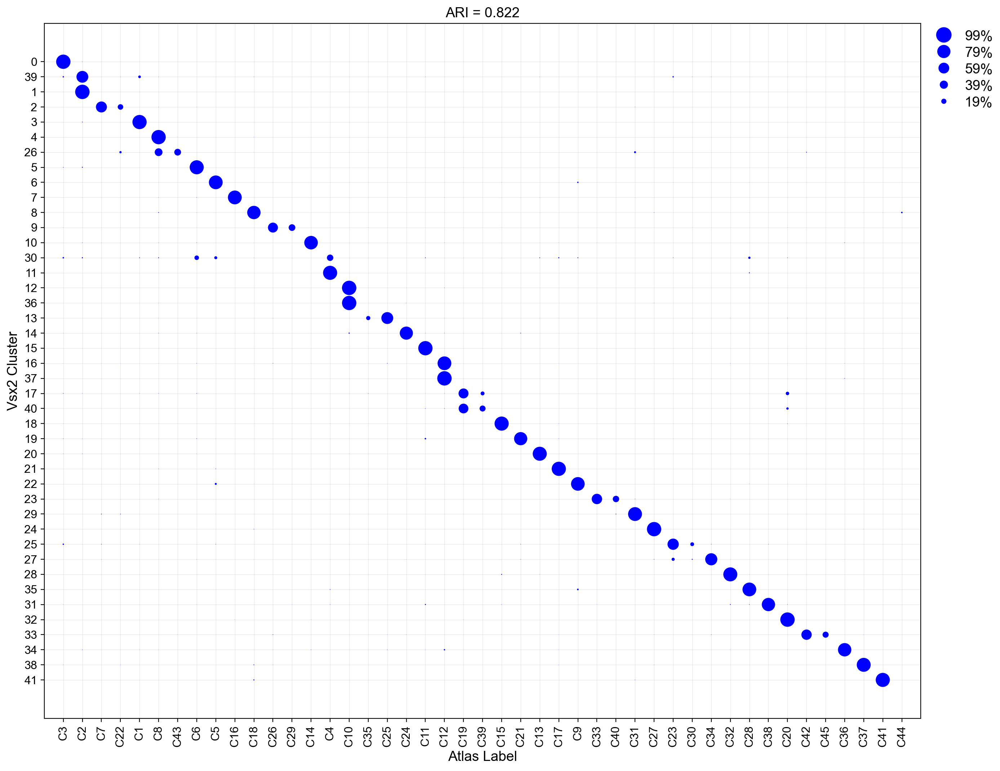

In [537]:
vsx2_cols = [ 'C3', 'C2',  'C7', 'C22','C1', 
             'C8','C43','C6',  'C5',  'C16',
             'C18','C26', 'C29',
              'C14', 'C4',  'C10','C35', 
              'C25', 'C24', 'C11',
              'C12','C19','C39', 
              'C15', 'C21','C13',
      'C17',  'C9',  'C33', 'C40','C31',
           'C27',   'C23',  'C30', 'C34',
             'C32', 'C28', 'C38',
             'C20', 'C42','C45','C36', 'C37',
             'C41', 'C44',]

vsx2_rows =  ['0','39',  '1', '2', '3', '4', '26', '5', '6', '7', '8', '9', '10', '30', '11', '12','36', 
              '13', '14', '15', '16',  '37', '17',  '40','18', '19', '20', '21', '22', '23', '29', '24', '25', 
              '27', '28',   '35',
              '31', '32', '33', '34', '38', '41', ]

vsx2_rows = np.array(vsx2_rows).astype(int)

plot_mapping(test_labels=test_labels_Vsx2, 
             test_predlabels=test_predlabels_Vsx2, 
             test_dict=Vsx2_dict, 
             train_dict=atlas_dict,
              re_order=True, re_order_cols=vsx2_cols,
              re_index=True, re_order_rows=vsx2_rows,
                 xaxislabel='Atlas Label', yaxislabel='Vsx2 Cluster', 
            save_as='figures/Vsx2_atlas_mapping.pdf')

In [994]:
Vsx2_leiden_new = []

for i in (Vsx2.obs.leiden_new):
    if (i in ('39', '1')):
        Vsx2_leiden_new.append('39_1')
        
    elif (i in ('12', '36')):
        Vsx2_leiden_new.append('12_36')
        
    elif (i in ('16', '37')):
        Vsx2_leiden_new.append('16_37')
        
    elif (i in ('40', '17')):
        Vsx2_leiden_new.append('40_17')
        
    else:
        Vsx2_leiden_new.append(i)

Vsx2_leiden_new_cat = pd.Categorical(Vsx2_leiden_new)
Vsx2_leiden_new_cat.value_counts().sort_values(ascending=False)

a = Vsx2_leiden_new_cat.reorder_categories(list(Vsx2_leiden_new_cat.value_counts().sort_values(ascending=False).index))

b = a.rename_categories(np.arange(len(a.categories)))
b.value_counts().sort_values(ascending=False)

Vsx2.obs['leiden_new'] = b

Vsx2.obs['leiden_new'] = pd.Categorical(Vsx2.obs['leiden_new'].values.astype('str'))

Vsx2_dict = make_dict(Vsx2, obs_id='leiden_new')

In [995]:
test_labels_Vsx2, test_predlabels_Vsx2, test_prediction_Vsx2 = predict(train_anndata=atlas, 
                                                                 common_top_genes=vsx2_atlas_hvgs, 
                                                                 bst_model_train_full=model_atlas_vsx2, 
                                                                 test_anndata=Vsx2,
                                                                 train_obs_id='Type_num', 
                                                                 test_dict=Vsx2_dict, 
                                                                 test_obs_id='leiden_new')

In [996]:
Vsx2.obs.leiden_new

RGCBClessS1_AAACGAAAGTGAGTGC     4
RGCBClessS1_AAACGAATCATACGAC    19
RGCBClessS1_AAACGAATCCACCCTA     0
RGCBClessS1_AAACGAATCCTACTGC     7
RGCBClessS1_AAACGAATCGATACGT     6
                                ..
RGCBClessS4_TTTGTTGAGAGCAGAA     2
RGCBClessS4_TTTGTTGGTGATTGGG    23
RGCBClessS4_TTTGTTGGTTGCCATA     8
RGCBClessS4_TTTGTTGTCCCGAGGT    11
RGCBClessS4_TTTGTTGTCGATGCAT     1
Name: leiden_new, Length: 22083, dtype: category
Categories (38, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

In [998]:
len(vsx2_rows)

38

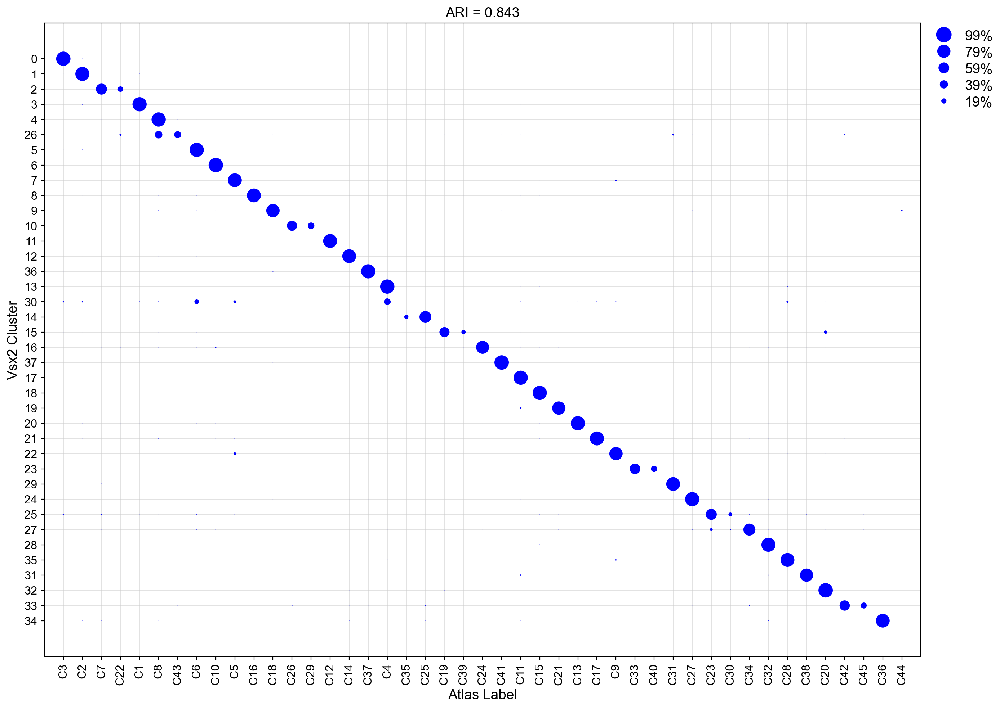

In [1010]:
vsx2_cols = [ 'C3', 'C2',  'C7', 'C22','C1', 
             'C8','C43','C6', 'C10', 'C5',  'C16',
             'C18','C26', 'C29',
              'C12','C14','C37', 'C4',  'C35', 
              'C25', 
              'C19','C39','C24', 'C41','C11', 
              'C15', 'C21','C13',
      'C17',  'C9',  'C33', 'C40','C31',
           'C27',   'C23',  'C30', 'C34',
             'C32', 'C28', 'C38',
             'C20', 'C42','C45','C36', 
              'C44',]

vsx2_rows =  ['0', '1', '2', '3', '4', '26', '5', '6', '7', '8', '9', '10', '11', '12','36', 
              '13', '30', '14', '15', '16',  '37', '17',  '18', '19', '20', '21', '22', '23', '29', '24', '25', 
              '27', '28',  '35',
              '31', '32', '33', '34', ]

plot_mapping(test_labels=test_labels_Vsx2, 
             test_predlabels=test_predlabels_Vsx2, 
             test_dict=Vsx2_dict, 
             train_dict=atlas_dict,
              re_order=True, re_order_cols=vsx2_cols,
              re_index=True, re_order_rows=vsx2_rows,
                 xaxislabel='Atlas Label', yaxislabel='Vsx2 Cluster', 
            save_as='figures/Vsx2_atlas_mapping.pdf')

In [1011]:
Vsx2.obs['Prob'] = np.max(test_prediction_Vsx2, axis=1)
Vsx2.obs['Atlas Label'] = encode_dict(atlas_dict, test_predlabels_Vsx2)

... storing 'Atlas Label' as categorical


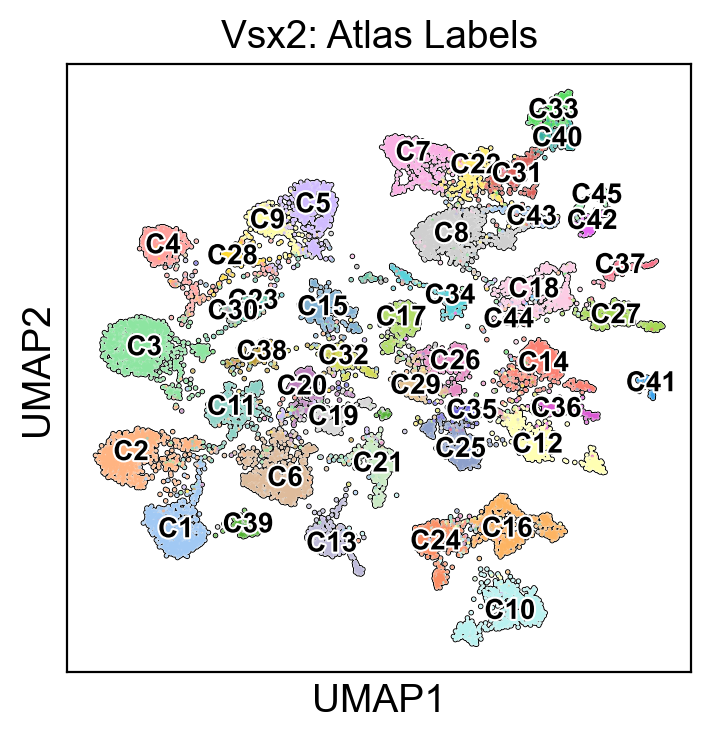

In [1012]:
sc.pl.umap(Vsx2, color=['Atlas Label'], title='Vsx2: Atlas Labels',
           legend_fontoutline=1.5, legend_fontsize=10, legend_loc='on data', palette=type_cols,
          add_outline=True, save='_Vsx2_type.pdf')

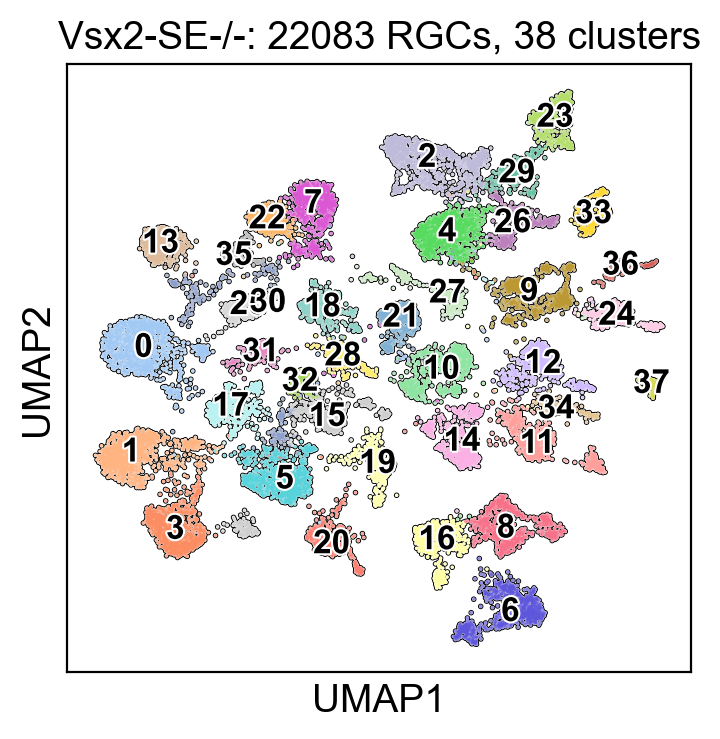

In [1013]:
sc.pl.umap(Vsx2, color=['leiden_new'], title='Vsx2-SE-/-: '+ str(Vsx2.shape[0])+ ' RGCs, ' + str(len(Vsx2.obs.leiden_new.values.categories)) + ' clusters',
           legend_fontoutline=1.5, legend_fontsize=12, legend_loc='on data', palette=type_cols,
          add_outline=True,  save='_Vsx2_leiden.pdf')

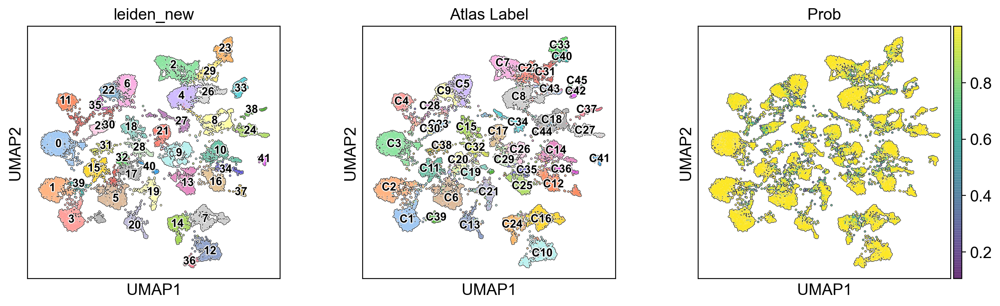

In [318]:
sc.pl.umap(Vsx2, color=['leiden_new', 'Atlas Label', 'Prob'], legend_loc='on data', palette=type_cols, 
           legend_fontoutline=1.5, legend_fontsize=10,
          add_outline=True)

## Group analyses

In [526]:
atlas_sub = atlas.copy()
sc.pp.subsample(atlas_sub, n_obs=20000)

In [527]:
atlas_sub

AnnData object with n_obs × n_vars = 20000 × 18222
    obs: 'Type', 'Batch', 'Type_num', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Sil'
    var: 'highly_variable', 'mean', 'std', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Type_num_colors', 'hvg', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'R_tsne', 'X_harmony', 'X_pca', 'X_umap', 'X_harmony_z'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

In [15]:
atlas_sil_gr = silhouette_samples(X=atlas.obsm['X_harmony'][:,0:40], labels=atlas.obs.Type_num)
#atlas_sil_gr_sub = silhouette_samples(X=atlas_sub.obsm['X_harmony'][:,0:40], labels=atlas_sub.obs.Type_num)
dr_sil_gr = silhouette_samples(X=dr_corr.obsm['X_harmony'][:,0:40], labels=dr_corr.obs['Atlas Label'])
rd1_sil_gr = silhouette_samples(X=rd1.obsm['X_harmony'][:,0:40], labels=rd1.obs['Atlas Label'])
vsx2_sil_gr = silhouette_samples(X=Vsx2.obsm['X_harmony'][:,0:40], labels=Vsx2.obs['Atlas Label'])

In [1015]:
atlas.obs['Sil'] = atlas_sil_gr
dr_corr.obs['Sil'] = dr_sil_gr
rd1.obs['Sil'] = rd1_sil_gr
Vsx2.obs['Sil'] = vsx2_sil_gr

In [458]:
atlas.obs.Type_num.values.categories

Index(['C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19',
       'C1', 'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28',
       'C29', 'C2', 'C30', 'C31', 'C32', 'C33', 'C34', 'C35', 'C36', 'C37',
       'C38', 'C39', 'C3', 'C40', 'C41', 'C42', 'C43', 'C44', 'C45', 'C4',
       'C5', 'C6', 'C7', 'C8', 'C9'],
      dtype='object')

In [14]:
atlas_type_sils = clust_obs(atlas, obs_id='Sil', obs_id_split='Type_num')
dr_type_sils = clust_obs(dr_corr, obs_id='Sil', obs_id_split='Atlas Label')
rd1_type_sils = clust_obs(rd1, obs_id='Sil', obs_id_split='Atlas Label')
vsx2_type_sils = clust_obs(Vsx2, obs_id='Sil', obs_id_split='Atlas Label')

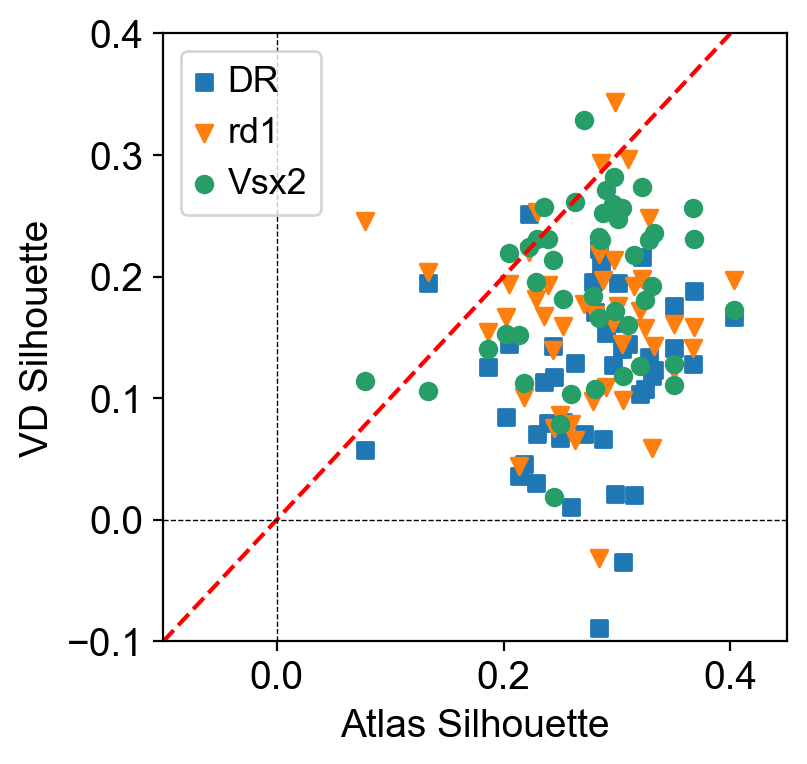

In [1028]:
plt.scatter(atlas_type_sils, dr_type_sils, label='DR', marker='s')
plt.scatter(atlas_type_sils, rd1_type_sils, label='rd1', marker='v')
plt.scatter(atlas_type_sils, vsx2_type_sils, label='Vsx2')
plt.plot(np.linspace(-0.1,0.4), np.linspace(-0.1,0.4), ls='--', color='red')
plt.axhline(0, ls='--', color='black', linewidth=0.5)
plt.axvline(0, ls='--', color='black', linewidth=0.5)


plt.legend()
plt.grid(False)
plt.xlim([-0.1,0.45])
plt.ylim([-0.1,0.4])
plt.xlabel('Atlas Silhouette')
plt.ylabel('VD Silhouette')
plt.savefig('figures/VD_vs_atlas_sil.pdf')

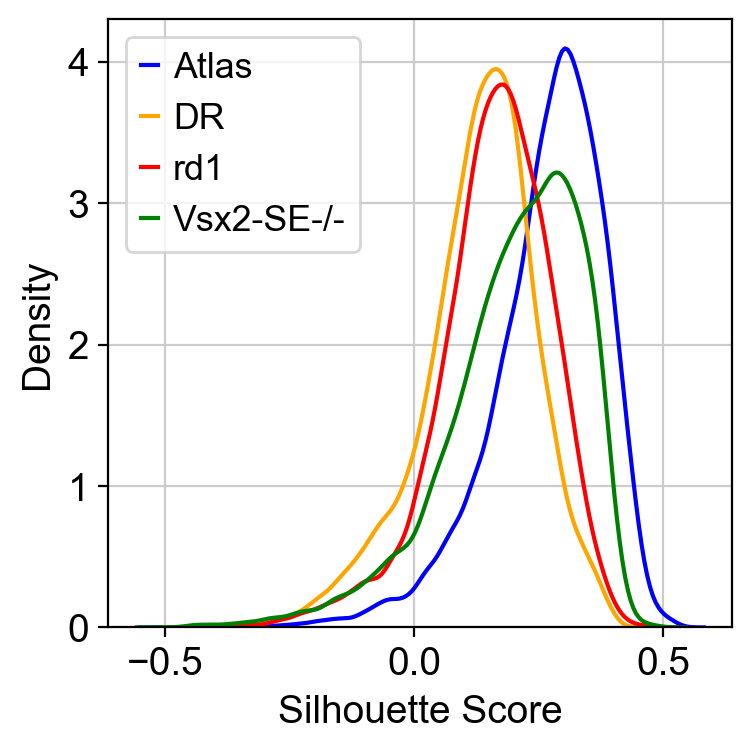

In [18]:
sn.distplot(atlas_sil_gr, label='Atlas',color='blue', hist=False)
sn.distplot(dr_sil_gr, label='DR', color='orange', hist=False)
sn.distplot(rd1_sil_gr, label='rd1',color='red', hist=False)
sn.distplot(vsx2_sil_gr, label='Vsx2-SE-/-', color='green', hist=False)
plt.legend()
plt.xlabel('Silhouette Score')
#plt.xlim([-0.4,0.6])
plt.show()

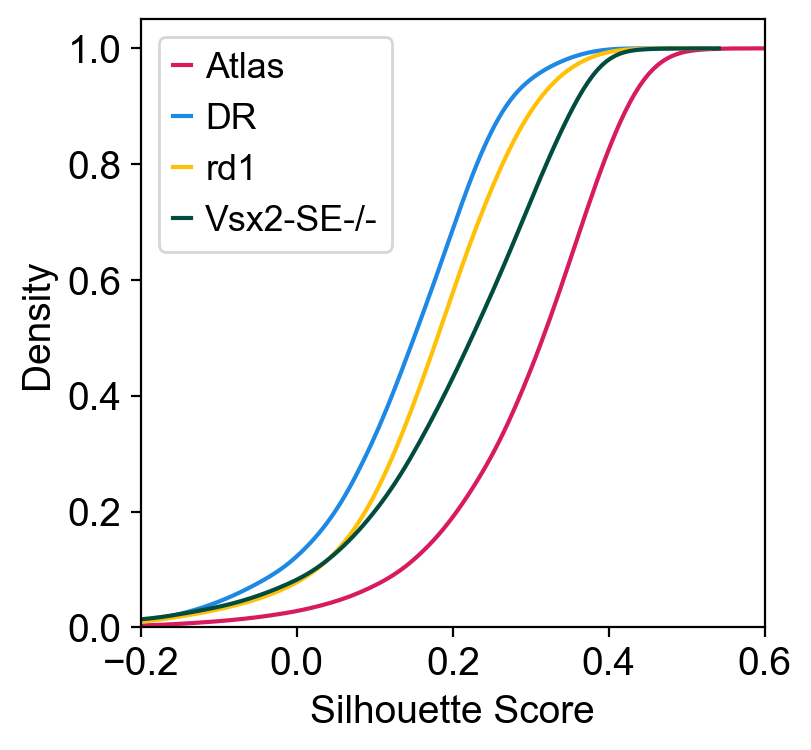

In [16]:
sn.kdeplot(atlas_sil_gr, label='Atlas',color='#D81B60', cumulative=True,)
sn.kdeplot(dr_sil_gr, label='DR', color='#1E88E5', cumulative=True,)
sn.kdeplot(rd1_sil_gr, label='rd1',color='#FFC107', cumulative=True,)
sn.kdeplot(vsx2_sil_gr, label='Vsx2-SE-/-', color='#004D40', cumulative=True,)

# sn.kdeplot(atlas_b1_sil, label='Batch1', color=type_cols[20], cumulative=True)
# sn.kdeplot(atlas_b2_sil, label='Batch2', color=type_cols[21], cumulative=True)
# sn.kdeplot(atlas_b3_sil, label='Batch3', color=type_cols[22], cumulative=True)


plt.legend()
plt.xlabel('Silhouette Score')
plt.xlim([-0.2,0.6])
plt.grid(False)
#plt.savefig('figures/cdf_sil.pdf')

In [23]:
sp.stats.ttest_ind(atlas_sil_gr, dr_sil_gr,)

Ttest_indResult(statistic=146.45905622110288, pvalue=0.0)

In [ ]:
sp.stats.ks_2samp(atlas_sil_gr, rd1_sil_gr), sp.stats.ks_2samp(atlas_sil_gr, vsx2_sil_gr)

In [13]:
sn.kdeplot(atlas_sil_gr_sub, label='Atlas',color='#D81B60', cumulative=True,)
sn.kdeplot(dr_sil_gr, label='DR', color='#1E88E5', cumulative=True,)
sn.kdeplot(rd1_sil_gr, label='rd1',color='#FFC107', cumulative=True,)
sn.kdeplot(vsx2_sil_gr, label='Vsx2-SE-/-', color='#004D40', cumulative=True,)

# sn.kdeplot(atlas_b1_sil, label='Batch1', color=type_cols[20], cumulative=True)
# sn.kdeplot(atlas_b2_sil, label='Batch2', color=type_cols[21], cumulative=True)
# sn.kdeplot(atlas_b3_sil, label='Batch3', color=type_cols[22], cumulative=True)


plt.legend()
plt.xlabel('Silhouette Score')
plt.xlim([-0.2,0.6])
plt.grid(False)
#plt.savefig('figures/cdf_sil.pdf')

NameError: name 'atlas_sil_gr_sub' is not defined

In [ ]:
atlas_sil_gr = silhouette_samples(X=atlas.obsm['X_harmony'][:,0:40], labels=atlas.obs.Type_num)
#atlas_sil_gr_sub = silhouette_samples(X=atlas_sub.obsm['X_harmony'][:,0:40], labels=atlas_sub.obs.Type_num)
dr_sil_gr = silhouette_samples(X=dr_corr.obsm['X_harmony'][:,0:40], labels=dr_corr.obs['Atlas Label'])
rd1_sil_gr = silhouette_samples(X=rd1.obsm['X_harmony'][:,0:40], labels=rd1.obs['Atlas Label'])
vsx2_sil_gr = silhouette_samples(X=Vsx2.obsm['X_harmony'][:,0:40], labels=Vsx2.obs['Atlas Label'])

In [36]:
sp.stats.wilcoxon(sample(list(atlas_sil_gr),1000), sample(list(dr_sil_gr),1000)), sp.stats.wilcoxon(sample(list(atlas_sil_gr),1000), sample(list(rd1_sil_gr),1000)), sp.stats.wilcoxon(sample(list(atlas_sil_gr),1000), sample(list(vsx2_sil_gr),1000))

(WilcoxonResult(statistic=50717.0, pvalue=9.390815549144995e-106),
 WilcoxonResult(statistic=68492.0, pvalue=4.4363768468936436e-88),
 WilcoxonResult(statistic=113775.0, pvalue=1.8403279893901427e-50))

In [24]:
sp.stats.ks_2samp(atlas_sil_gr, dr_sil_gr), sp.stats.ks_2samp(atlas_sil_gr, rd1_sil_gr), sp.stats.ks_2samp(atlas_sil_gr, vsx2_sil_gr)

(KstestResult(statistic=0.5689801189568037, pvalue=0.0),
 KstestResult(statistic=0.4744374260105823, pvalue=0.0),
 KstestResult(statistic=0.2945136939386219, pvalue=0.0))

In [26]:
sp.stats.ks_2samp(atlas_sil_gr, dr_sil_gr)

0.0

# Mito/Ribo plots

In [162]:
dr_corr = dr_corr[dr_corr.obs['pct_counts_Rp']<10,:]
atlas = atlas[atlas.obs['pct_counts_mt']<30,:]

In [163]:
atlas.obs['Type_num'] = atlas.obs['Type_num'].cat.reorder_categories(dr_corr.obs['Atlas Label'].values.categories)

Trying to set attribute `.obs` of view, copying.


In [164]:
dat = pd.concat([pd.DataFrame({'Type':atlas.obs.Type_num.values.categories, 
              'Mito Perc': clust_obs(atlas, obs_id='pct_counts_mt', obs_id_split='Type_num'),
             'Condition':45*['NR']}),
         pd.DataFrame({'Type':dr_corr.obs['Atlas Label'].values.categories, 
              'Mito Perc': clust_obs(dr_corr, obs_id='pct_counts_mt', obs_id_split='Atlas Label'),
             'Condition':45*['DR']}),
         pd.DataFrame({'Type':rd1.obs['Atlas Label'].values.categories, 
              'Mito Perc': clust_obs(rd1, obs_id='pct_counts_mt', obs_id_split='Atlas Label'),
             'Condition':45*['rd1']}),
         pd.DataFrame({'Type':Vsx2.obs['Atlas Label'].values.categories, 
              'Mito Perc': clust_obs(Vsx2, obs_id='pct_counts_mt', obs_id_split='Atlas Label'),
             'Condition':45*['Vsx2']})])

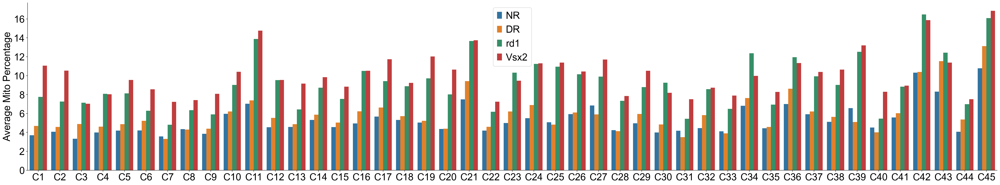

In [134]:
a = sn.catplot(x="Type", y="Mito Perc", hue="Condition", kind="bar", data=dat,legend=False)
a.fig.set_size_inches(40,5+ 5/3)
plt.ylabel('Average Mito Percentage', fontsize=24)
plt.legend(fontsize=24)
plt.grid(False)
plt.xticks(fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=24)

plt.savefig('figures/mito_barplot.pdf')
plt.show()

In [166]:
dat = pd.concat([pd.DataFrame({'Type':atlas.obs.Type_num.values.categories, 
              'Ribo Perc': clust_obs(atlas, obs_id='pct_counts_Rp', obs_id_split='Type_num'),
             'Condition':45*['NR']}),
         pd.DataFrame({'Type':dr_corr.obs['Atlas Label'].values.categories, 
              'Ribo Perc': clust_obs(dr_corr, obs_id='pct_counts_Rp', obs_id_split='Atlas Label'),
             'Condition':45*['DR']}),
         pd.DataFrame({'Type':rd1.obs['Atlas Label'].values.categories, 
              'Ribo Perc': clust_obs(rd1, obs_id='pct_counts_Rp', obs_id_split='Atlas Label'),
             'Condition':45*['rd1']}),
         pd.DataFrame({'Type':Vsx2.obs['Atlas Label'].values.categories, 
              'Ribo Perc': clust_obs(Vsx2, obs_id='pct_counts_Rp', obs_id_split='Atlas Label'),
             'Condition':45*['Vsx2']})])

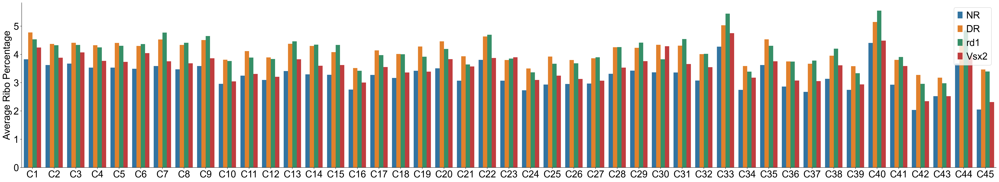

In [132]:
a = sn.catplot(x="Type", y="Ribo Perc", hue="Condition", kind="bar", data=dat,legend=False)
a.fig.set_size_inches(40,5+ 5/3)
plt.ylabel('Average Ribo Percentage', fontsize=24)
plt.legend(fontsize=24)
plt.grid(False)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

plt.xlabel('')
plt.savefig('figures/ribo_barplot.pdf')
plt.show()

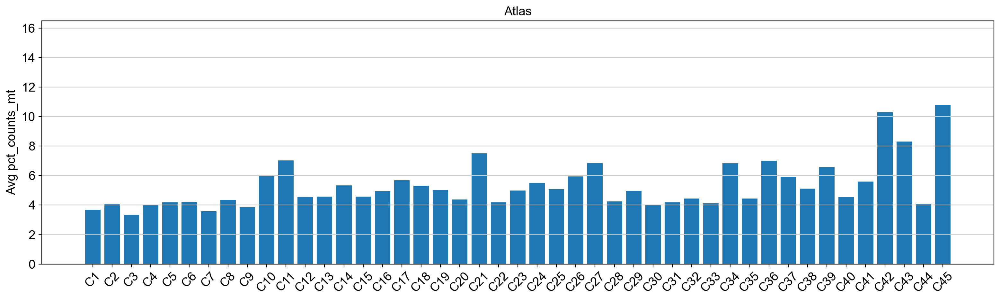

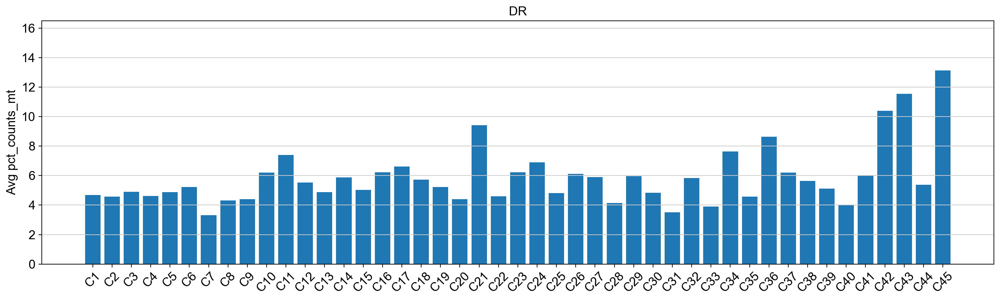

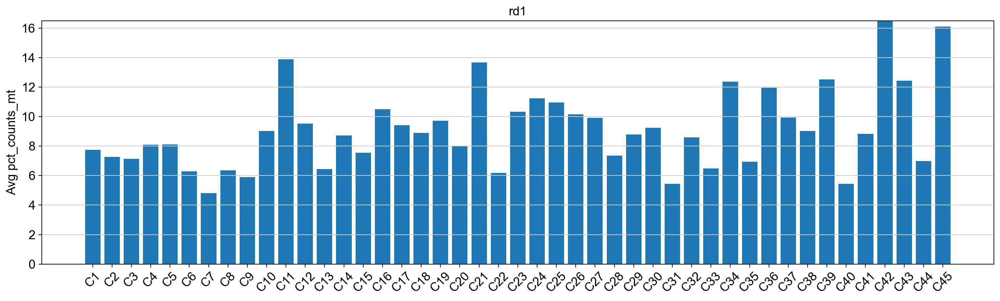

(0.0, 16.5)

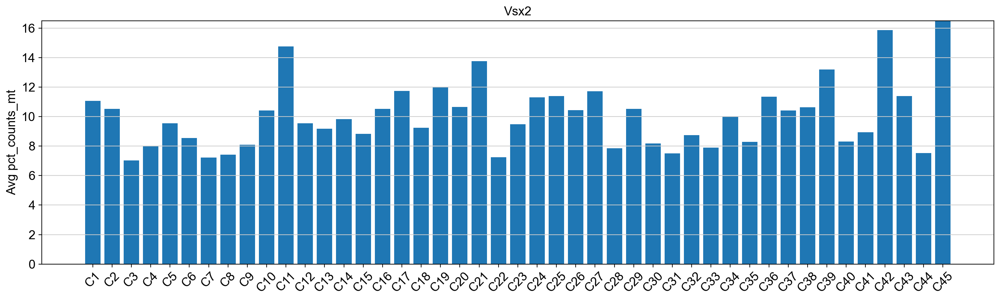

In [112]:
plt.figure(figsize=(19,5))
plt.bar(atlas.obs.Type_num.values.categories, clust_obs(atlas, obs_id='pct_counts_mt', obs_id_split='Type_num'))
plt.grid(axis='x')
plt.xticks(rotation=45)
plt.ylabel('Avg pct_counts_mt')
plt.title('Atlas')
plt.ylim([0,16.5])
plt.show()

plt.figure(figsize=(19,5))
plt.bar(dr_corr.obs['Atlas Label'].values.categories, clust_obs(dr_corr, obs_id='pct_counts_mt', 
                                                                obs_id_split='Atlas Label'))
plt.grid(axis='x')
plt.xticks(rotation=45)
plt.title('DR')
plt.ylabel('Avg pct_counts_mt')
plt.ylim([0,16.5])


plt.show()

plt.figure(figsize=(19,5))
plt.bar(rd1.obs['Atlas Label'].values.categories, clust_obs(rd1, obs_id='pct_counts_mt', 
                                                                obs_id_split='Atlas Label'))
plt.grid(axis='x')
plt.xticks(rotation=45)
plt.title('rd1')
plt.ylabel('Avg pct_counts_mt')
plt.ylim([0,16.5])


plt.show()


plt.figure(figsize=(19,5))
plt.bar(Vsx2.obs['Atlas Label'].values.categories, clust_obs(Vsx2, obs_id='pct_counts_mt', 
                                                                obs_id_split='Atlas Label'))
plt.grid(axis='x')
plt.xticks(rotation=45)
plt.title('Vsx2')
plt.ylabel('Avg pct_counts_mt')
plt.ylim([0,16.5])



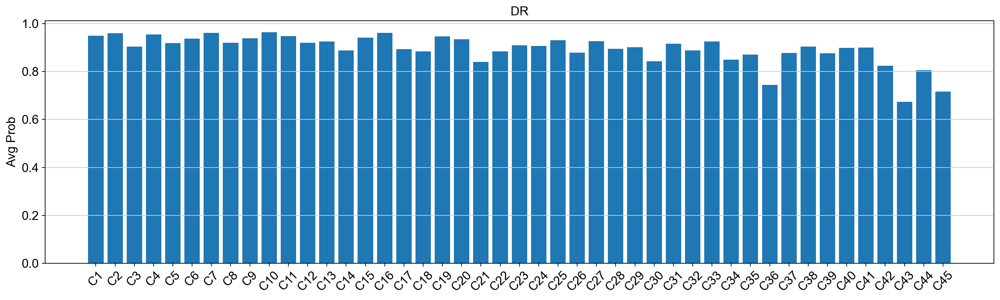

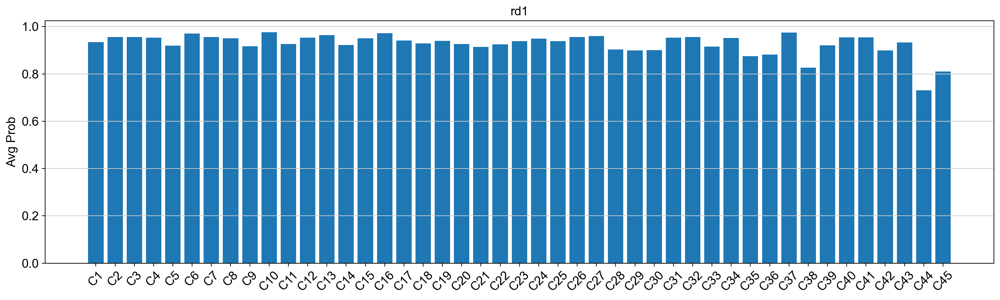

Text(0, 0.5, 'Avg Prob')

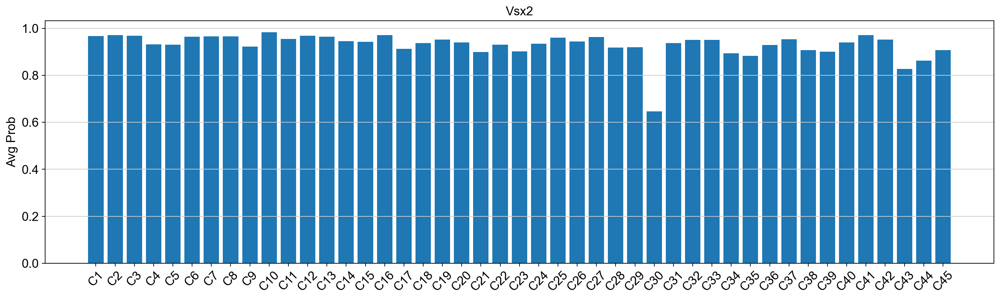

In [68]:
plt.figure(figsize=(19,5))
plt.bar(dr_corr.obs['Atlas Label'].values.categories, clust_obs(dr_corr, obs_id='Prob', 
                                                                obs_id_split='Atlas Label'))
plt.grid(axis='x')
plt.xticks(rotation=45)
plt.title('DR')
plt.ylabel('Avg Prob')


plt.show()

plt.figure(figsize=(19,5))
plt.bar(rd1.obs['Atlas Label'].values.categories, clust_obs(rd1, obs_id='Prob', 
                                                                obs_id_split='Atlas Label'))
plt.grid(axis='x')
plt.xticks(rotation=45)
plt.title('rd1')
plt.ylabel('Avg Prob')


plt.show()


plt.figure(figsize=(19,5))
plt.bar(Vsx2.obs['Atlas Label'].values.categories, clust_obs(Vsx2, obs_id='Prob', 
                                                                obs_id_split='Atlas Label'))
plt.grid(axis='x')
plt.xticks(rotation=45)
plt.title('Vsx2')
plt.ylabel('Avg Prob')



# S3B CAMs re-do

In [179]:
def vd_dotplot(tfs, anc_list):
    
    e13_tf = anc_list[0][:, tfs]
    e14_tf = anc_list[1][:, tfs]
    e16_tf = anc_list[2][:, tfs]
    p0_tf = anc_list[3][:, tfs]


    e13_tf.var.index = [s + ' NR' for s in tfs]
    e14_tf.var.index = [s + ' DR' for s in tfs]
    e16_tf.var.index = [s + ' rd1' for s in tfs]
    p0_tf.var.index = [s + ' Vsx2' for s in tfs]

    a = e13_tf.concatenate(e14_tf, e16_tf, p0_tf, join='outer')
    
    return a 

In [190]:
csms_frequent = ['Cbln4', 'Cdhr1', 'Ngfr',  'Cdh1' , 'Kit',  'Slitrk6', 'Igfbpl1', 'Pcdh20', 'Ptprt',
                  'Robo1',  'Sdk1', 'Il1rapl2', 'Sema3d', 
                  'Ntrk1',  ]

In [191]:
csms_obj_vd = vd_dotplot(csms_frequent, anc_list=[atlas, dr_corr, rd1, Vsx2])

way = pd.DataFrame([[s + ' NR' for s in csms_frequent], [s + ' DR' for s in csms_frequent], 
             [s + ' rd1' for s in csms_frequent], [s + ' Vsx2' for s in csms_frequent],])

csms_order = []
for i in range(way.shape[1]):
    csms_order = csms_order + list(way.to_numpy()[:,i]) 


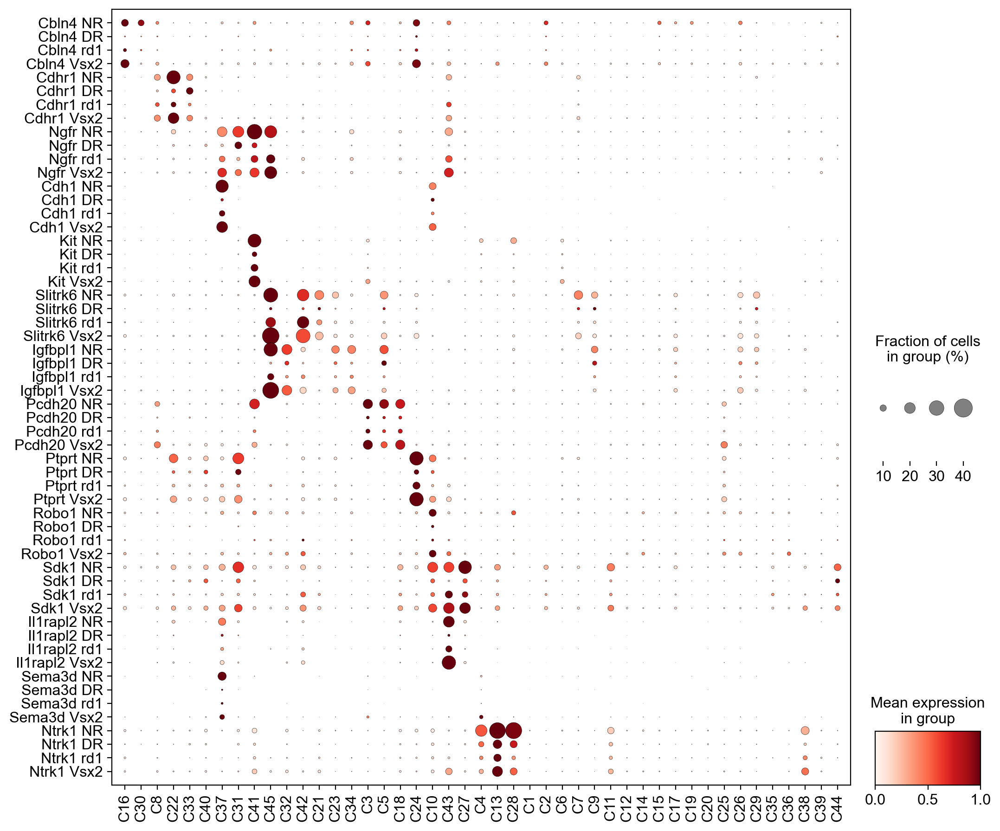

In [195]:
sc.pl.dotplot(csms_obj_vd, csms_order, swap_axes=True, standard_scale='var', groupby='Atlas Label',
           dot_max=0.4,use_raw=False,figsize=(12,11),
              categories_order= [  'C16', 'C30',
                                                    'C8', 'C22', 'C33', 'C40',
                                                     'C37','C31', 'C41','C45', 'C32','C42', 
                                                    'C21',  'C23','C34',
                                                    'C3','C5', 'C18','C24','C10', 'C43',
                                                    'C27', 'C4', 'C13','C28', 
                                                    'C1', 'C2',   'C6', 'C7', 'C9', 
                                                    'C11',
       'C12', 'C14', 'C15',  'C17', 'C19', 'C20',   'C25', 'C26',  'C29',  
       'C35', 'C36', 'C38', 'C39', 
        'C44', ],
             save='_CSMs_VDcomp.pdf')